In [1]:
%matplotlib notebook
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
from numpy.linalg import inv
import matplotlib.pyplot as plt
plt.style.use('seaborn')
import time

from BZI.pseudopots import (free_PP, Al_PP,
                            multiple_free_PP)
from BZI.plots import (plot_mesh, plot_band_structure, plot_paths,
                       create_convergence_plot, plot_states,
                       scatter_plot_pp, generate_states_data,
                       plot_states_data)
from BZI.symmetry import make_ptvecs, make_rptvecs, reduce_kpoint_list
from BZI.sampling import make_grid
from BZI.integration import rectangular_fermi_level, rectangular_method
from BZI.tetrahedron import (grid_and_tetrahedra, calc_fermi_level,
                             calc_total_energy,
                             get_corrected_total_energy,
                             get_grid_tetrahedra,
                             find_irreducible_tetrahedra,
                             get_extended_tetrahedra,
                             density_of_states,
                             number_of_states)

# Single Free Electron

Let's look at various properties of the free electron bands. The energy dispersion curve will consist of a single quadratic centered at the origin. We'll also observe convergence behavior of the Fermi level and total energy.

## 2nd Degree

### Band Plot

<IPython.core.display.Javascript object>


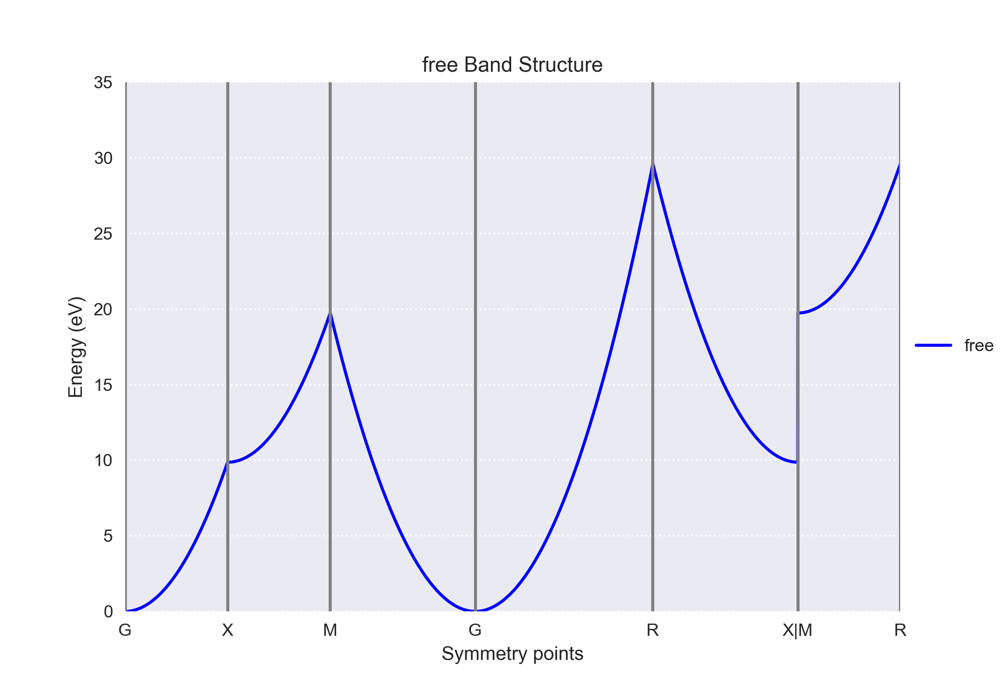

In [4]:
free_energy_shift = free_PP.eval([0.]*3,1)[0]
free_args = {"materials_list": ["free"],
           "PPlist": [free_PP],
           "PPargs_list": [{"neigvals": 1}],
           "lattice": free_PP.lattice,
           "npts": 1000,
           "neigvals": 1,
           "energy_shift": free_energy_shift,
           "energy_limits": [0,35],
           "show": True}

plot_band_structure(**free_args)

### Tetrahedra Grid

<IPython.core.display.Javascript object>


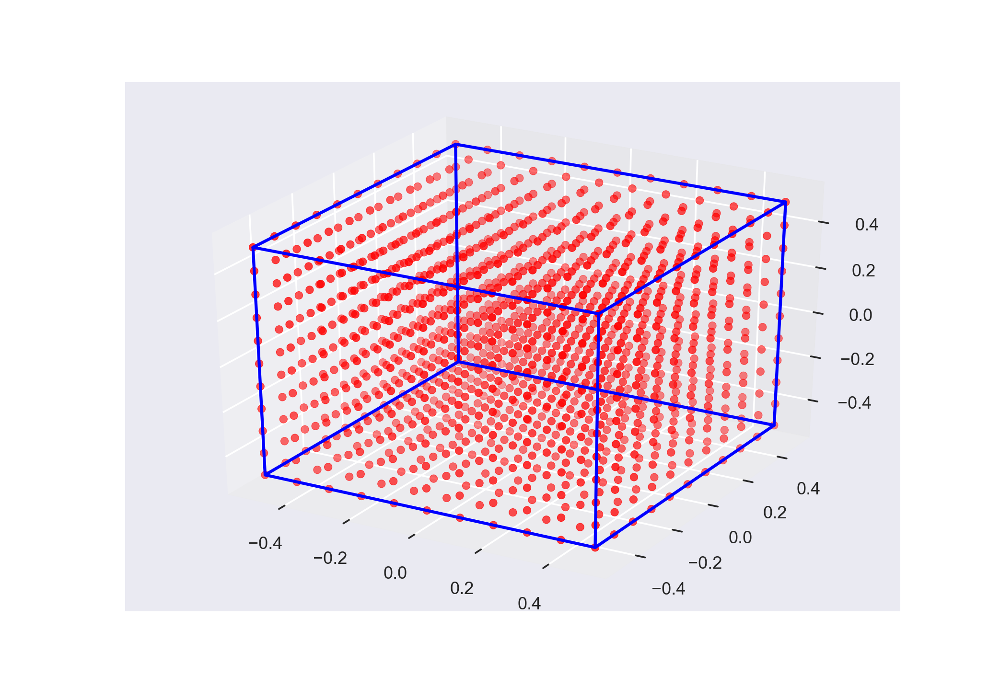

In [5]:
ndivs= 10
lat_shift = [-1./2]*3
grid_shift = [0,0,0]
tet_grid, tetrahedra = grid_and_tetrahedra(free_PP, ndivs, lat_shift, grid_shift)
weights = np.ones(len(tetrahedra))

plot_offset = np.dot(free_PP.lattice.reciprocal_vectors, lat_shift)
plot_mesh(tet_grid, free_PP.lattice.reciprocal_vectors, plot_offset)

### Rectangular method grid

<IPython.core.display.Javascript object>


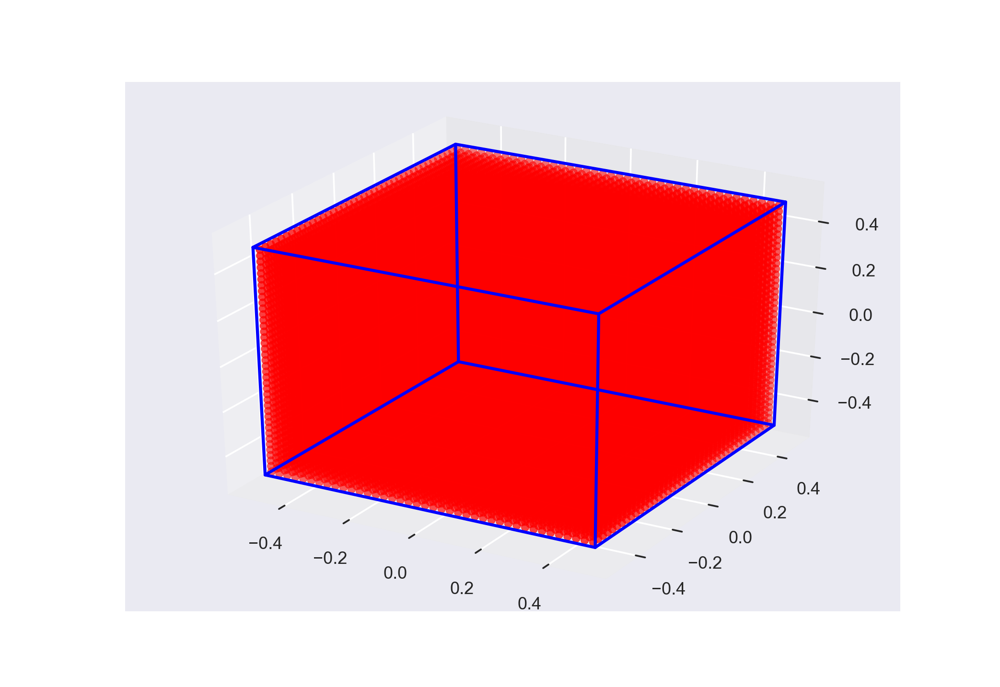

In [11]:
ndivs = 40
grid_consts = [ndivs]*3
grid_centering = "prim"
grid_angles = [np.pi/2]*3
grid_vecs = make_ptvecs(grid_centering, grid_consts, grid_angles)
rgrid_vecs = make_rptvecs(grid_vecs)
offset = np.dot(inv(rgrid_vecs), -np.sum(free_PP.lattice.reciprocal_vectors, 1)/2) + (
         [0.5]*3)
rec_grid = make_grid(free_PP.lattice.reciprocal_vectors, rgrid_vecs, offset)

plot_offset = np.dot(free_PP.lattice.reciprocal_vectors, lat_shift)
plot_mesh(rec_grid, free_PP.lattice.reciprocal_vectors, plot_offset)

In [14]:
def free_nos(energy, degree):
    """Evaluate the exact number of states for the free electron model.
    """
    return energy**(3./degree)/(3*np.pi**2)

def free_dos(energy, degree):
    """Evaluate the exact density of states for the free electron model.
    """
    return energy**((3. - degree)/degree)/(degree*np.pi**2)


### Density of states and number of states

<IPython.core.display.Javascript object>


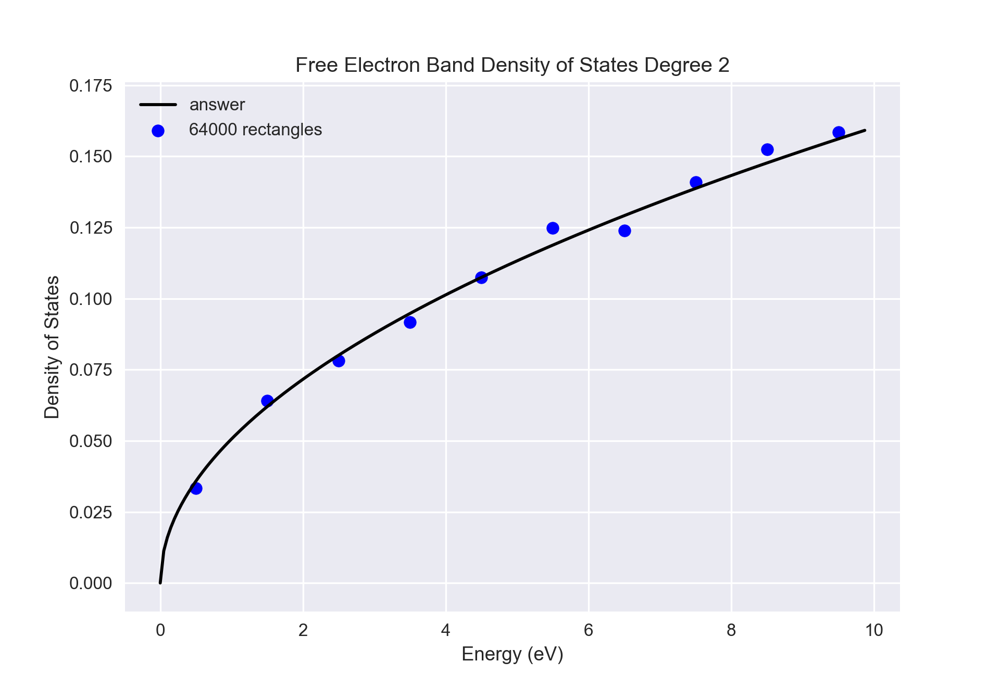

In [16]:
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(2)
rec_dos_args = {"PP": free_PP,
                "grid": rec_grid,
                "tetrahedra": None,
                "weights": None,
                "method": "rectangles",
                "energy_list": energy_list,
                "quantity": "dos",
                "nbands": 1,
                "answer": free_dos,
                "title": "Free Electron Band Density of States Degree 2",
                "xlimits": [min(energy_list) - dE,
                            max(energy_list) + dE],
                "ylimits": [-0.01, 0.176],
                "labels": ["%i rectangles"%len(rec_grid), "answer"],
                "bin_size": 0.5,
                "save": "rectangles_DOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Single Free Electron/degree_2/")}
plot_states(**rec_dos_args)

<IPython.core.display.Javascript object>


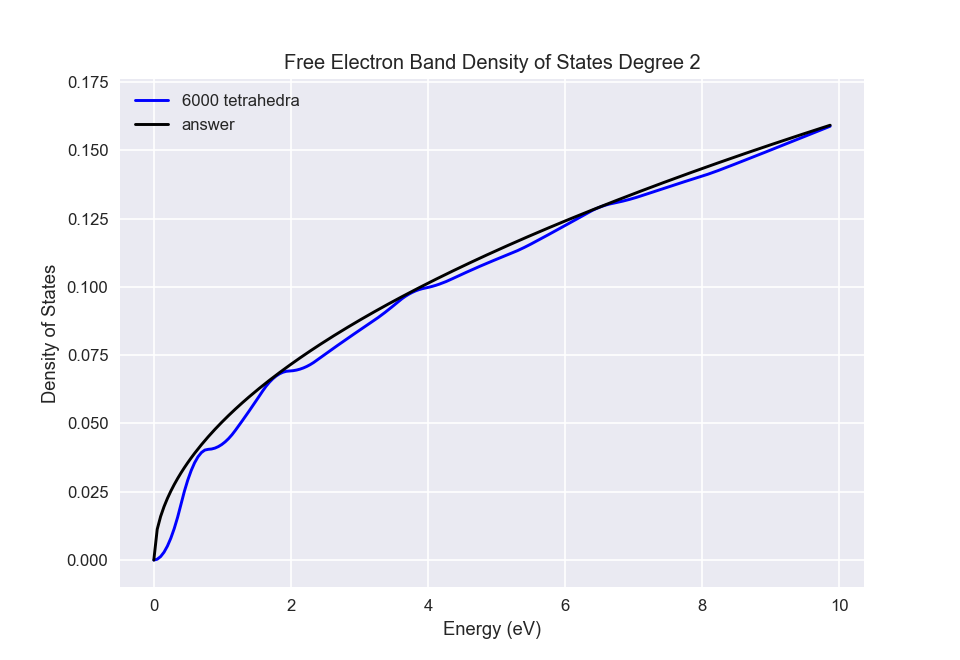

In [113]:
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(2)
tet_dos_args = {"PP": free_PP,
                "grid": tet_grid,
                "tetrahedra": tetrahedra,
                "weights": weights,
                "method": "tetrahedra",
                "energy_list": energy_list,
                "quantity": "dos",
                "nbands": 1,
                "answer": free_dos,
                "title": "Free Electron Band Density of States Degree 2",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 0.176],
                "labels": ["%i tetrahedra"%np.sum(weights), "answer"],
                "save": "tetrahedra_DOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Single Free Electron/degree_2/")}
plot_states(**tet_dos_args)

<IPython.core.display.Javascript object>


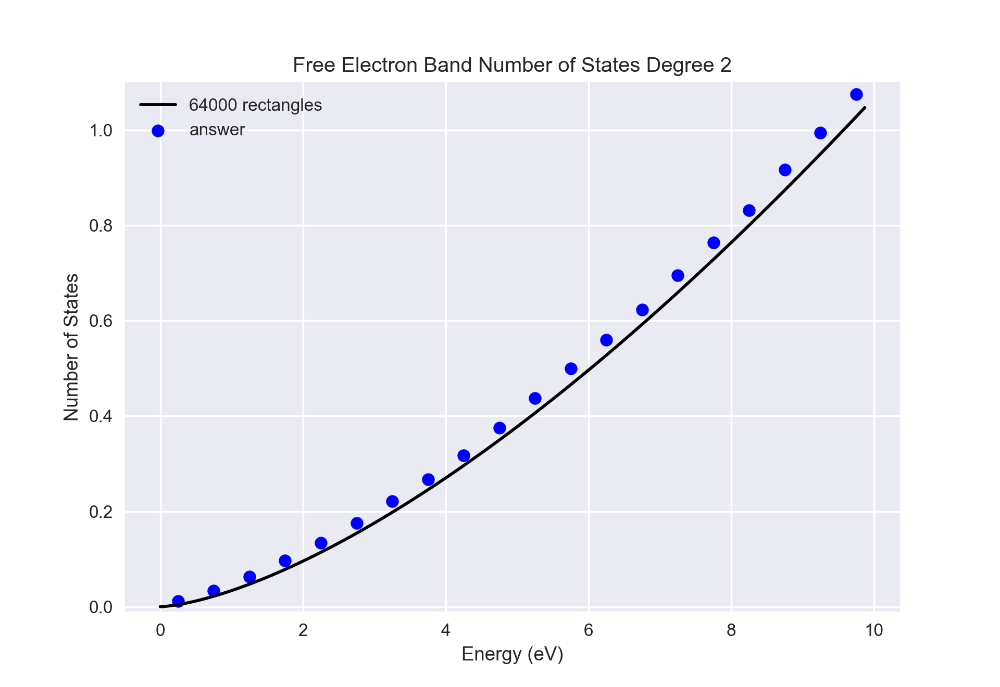

In [33]:
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(2)
rec_nos_args = {"PP": free_PP,
                "grid": rec_grid,
                "tetrahedra":None,
                "weights": None,
                "method": "rectangles",
                "energy_list": energy_list,
                "quantity": "nos",
                "nbands": 1,
                "answer": free_nos,
                "title": "Free Electron Band Number of States Degree 2",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 1.1],
                "labels": ["%i rectangles"%len(rec_grid), "answer"],
                "bin_size": 0.5,
                "save": "rectangles_NOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Single Free Electron/degree_2/")}
plot_states(**rec_nos_args)

<IPython.core.display.Javascript object>


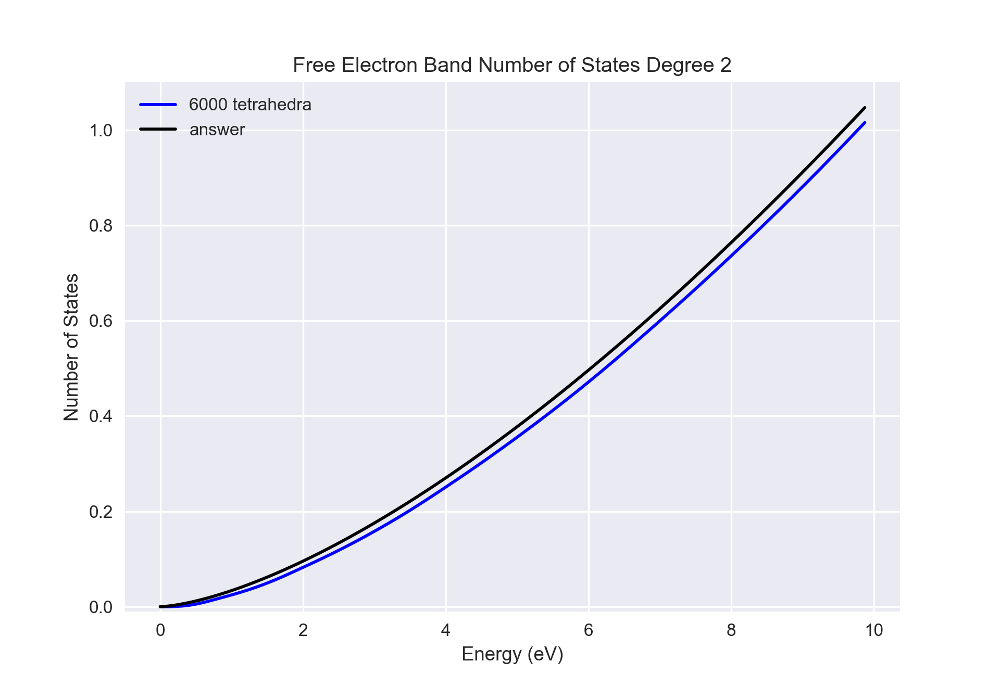

In [35]:
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(2)
tet_nos_args = {"PP": free_PP,
                "grid": tet_grid,
                "tetrahedra": tetrahedra,
                "weights": weights,
                "method": "tetrahedra",
                "energy_list": energy_list,
                "quantity": "nos",
                "nbands": 1,
                "answer": free_nos,
                "title": "Free Electron Band Number of States Degree 2",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 1.1],
                "labels": ["%i tetrahedra"%np.sum(weights), "answer"],
                "save": "tetrahedra_NOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Single Free Electron/degree_2/")}
plot_states(**tet_nos_args)

### Improved tetrahedron method

<IPython.core.display.Javascript object>


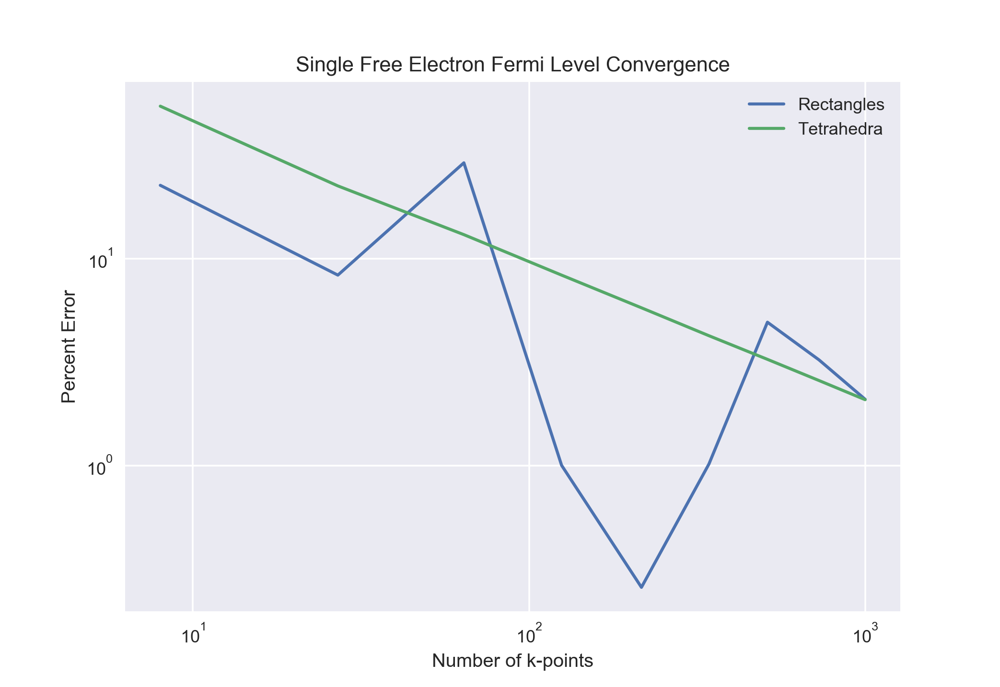

<IPython.core.display.Javascript object>


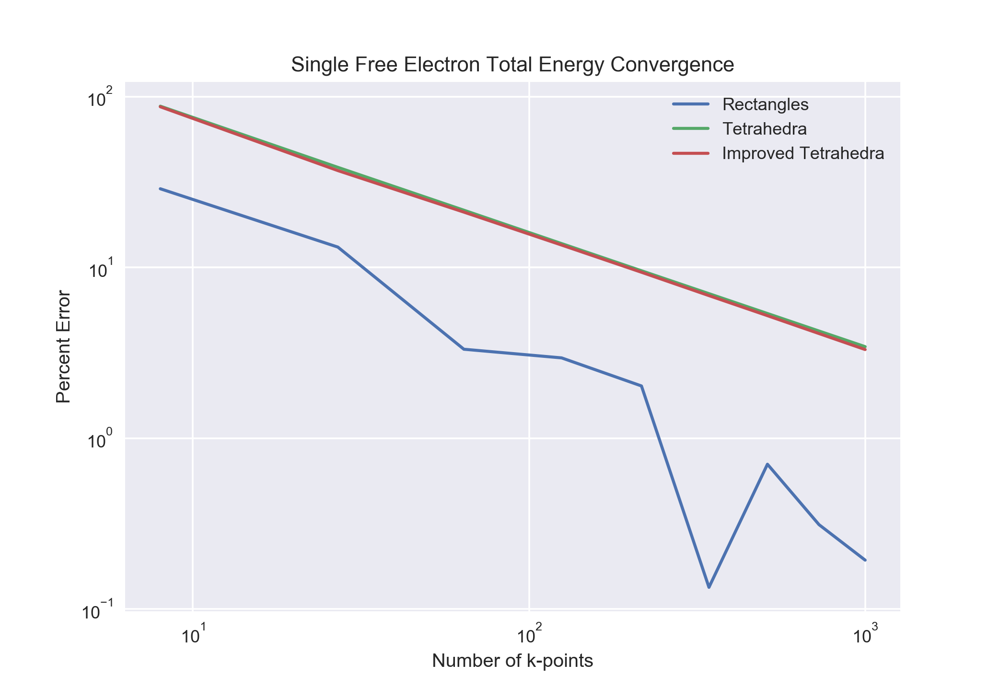

('Divisions ', 2)
('run time', 0.6730270385742188)
('Divisions ', 3)
('run time', 2.629815101623535)
('Divisions ', 4)
('run time', 6.767730951309204)
('Divisions ', 5)
('run time', 15.997980833053589)
('Divisions ', 6)
('run time', 35.6720929145813)
('Divisions ', 7)
('run time', 76.18656897544861)
('Divisions ', 8)
('run time', 134.72876906394958)
('Divisions ', 9)
('run time', 242.88428211212158)
('Divisions ', 10)
('run time', 425.51352882385254)


<IPython.core.display.Javascript object>


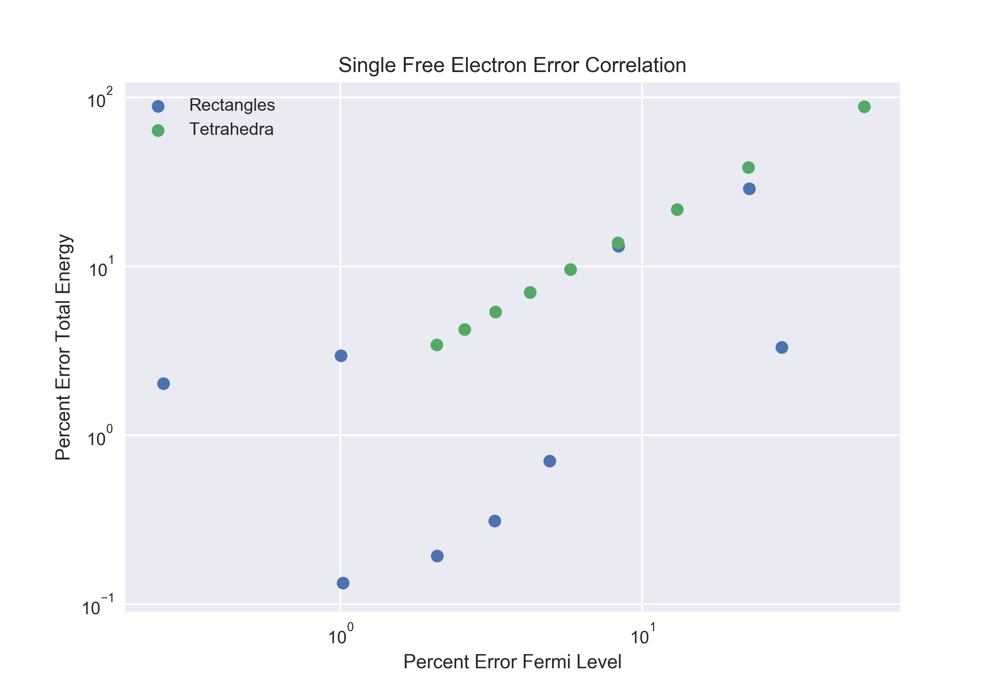

In [15]:
ndivisions = range(2, 11)
degree = 2
exact_fl = False
improved = True
symmetry = False
err_correlation = True
file_names = ["temp_fl", "improved_tet_te_conv1", "error_correlation1"]
PP_name = "Single Free Electron"
create_convergence_plot(free_PP, ndivisions, degree, exact_fl, improved, symmetry,
                        PP_name, file_names, err_correlation)

### Improved tetrahedron method with fixed Fermi level

<IPython.core.display.Javascript object>


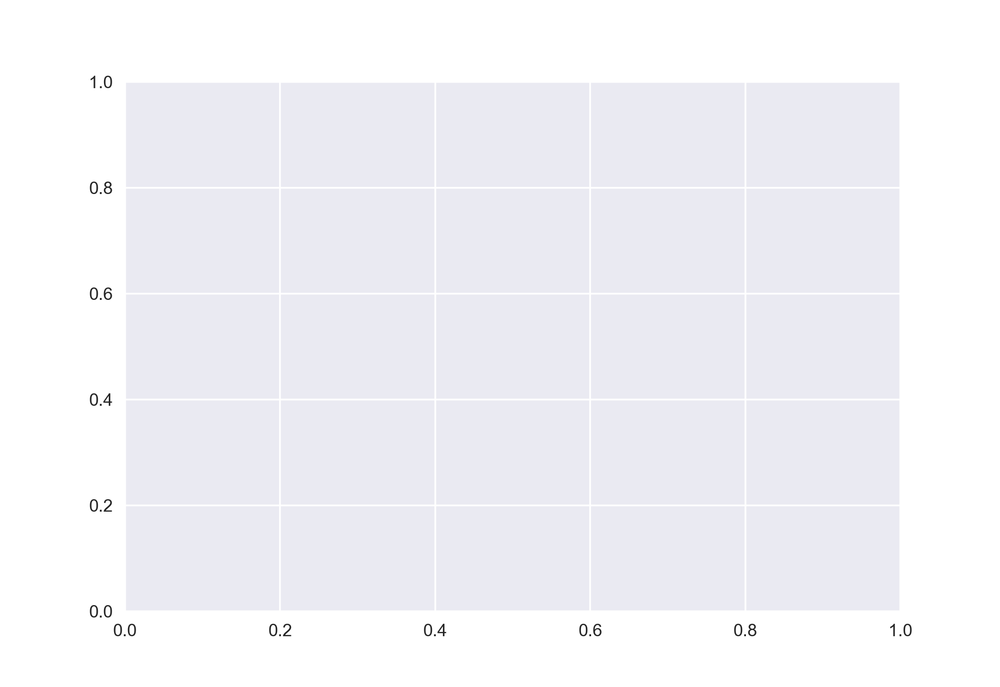

<IPython.core.display.Javascript object>


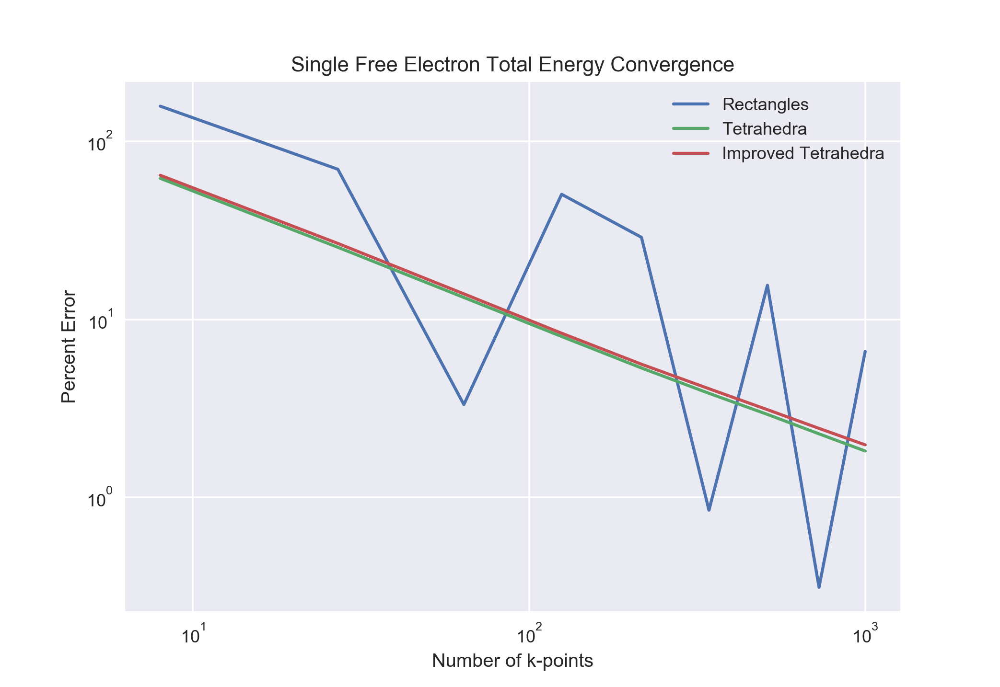

('Divisions ', 2)
('run time', 0.5455420017242432)
('Divisions ', 3)
('run time', 2.256032943725586)
('Divisions ', 4)
('run time', 6.792142868041992)
('Divisions ', 5)
('run time', 15.291988134384155)
('Divisions ', 6)
('run time', 35.07961106300354)
('Divisions ', 7)
('run time', 73.53478384017944)
('Divisions ', 8)
('run time', 134.33304715156555)
('Divisions ', 9)
('run time', 245.02672696113586)
('Divisions ', 10)
('run time', 415.55178117752075)


In [14]:
ndivisions = range(2, 11)
degree = 2
exact_fl = True
err_correlation = True
improved = True
symmetry = False
file_names = ["temp_fl", "fixed_fl_improved_tet_conv1"]
PP_name = "Single Free Electron"
create_convergence_plot(free_PP, ndivisions, degree, exact_fl, improved, symmetry,
                        PP_name, file_names, err_correlation)

### Dense grid

<IPython.core.display.Javascript object>


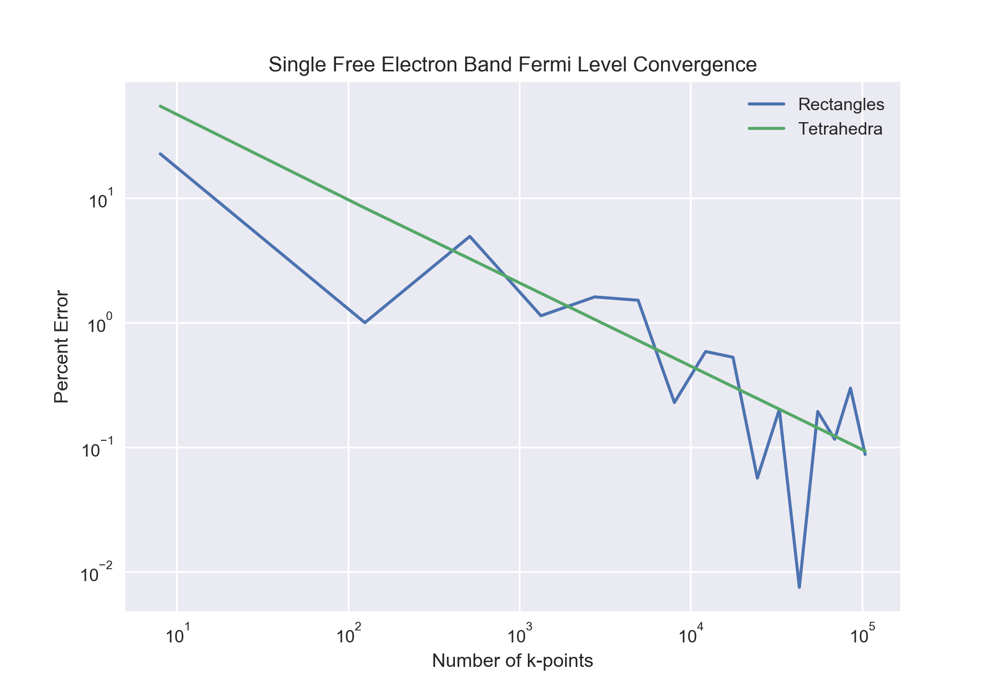

<IPython.core.display.Javascript object>


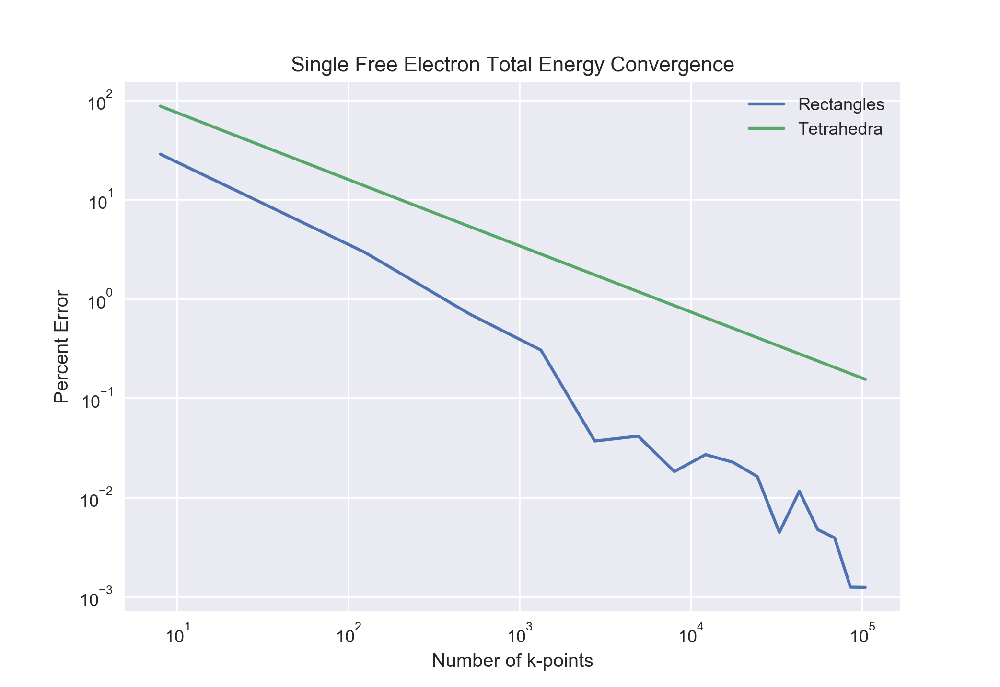

('Divisions ', 2)
('run time', 0.07828783988952637)
('Divisions ', 5)
('run time', 1.142232894897461)
('Divisions ', 8)
('run time', 4.550958871841431)
('Divisions ', 11)
('run time', 11.985981941223145)
('Divisions ', 14)
('run time', 25.25678014755249)
('Divisions ', 17)
('run time', 43.63101100921631)
('Divisions ', 20)
('run time', 68.32703685760498)
('Divisions ', 23)
('run time', 85.35115003585815)
('Divisions ', 26)
('run time', 135.23496103286743)
('Divisions ', 29)
('run time', 194.38258695602417)
('Divisions ', 32)
('run time', 262.4133470058441)
('Divisions ', 35)
('run time', 354.9840798377991)
('Divisions ', 38)
('run time', 426.52874302864075)
('Divisions ', 41)
('run time', 554.2966730594635)
('Divisions ', 44)
('run time', 701.5578589439392)
('Divisions ', 47)
('run time', 872.3762588500977)


In [22]:
ndivisions = range(2, 49, 3)
degree = 2
exact_fl = False
err_correlation = True
improved = False
symmetry = False
file_names = ["temp_fl", "tet_rec_dense_conv1", "err_correlation_dense1"]
PP_name = "Single Free Electron"
create_convergence_plot(free_PP, ndivisions, degree, exact_fl, improved, symmetry,
                        PP_name, file_names, err_correlation)

#### Dense grid, fixed Fermi level

<IPython.core.display.Javascript object>


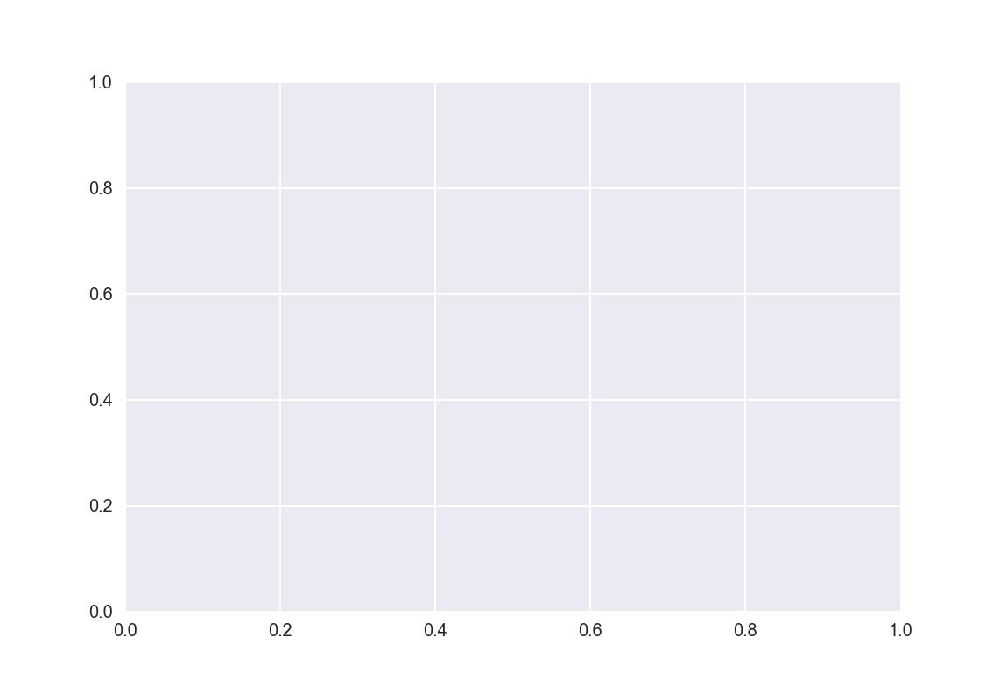

<IPython.core.display.Javascript object>


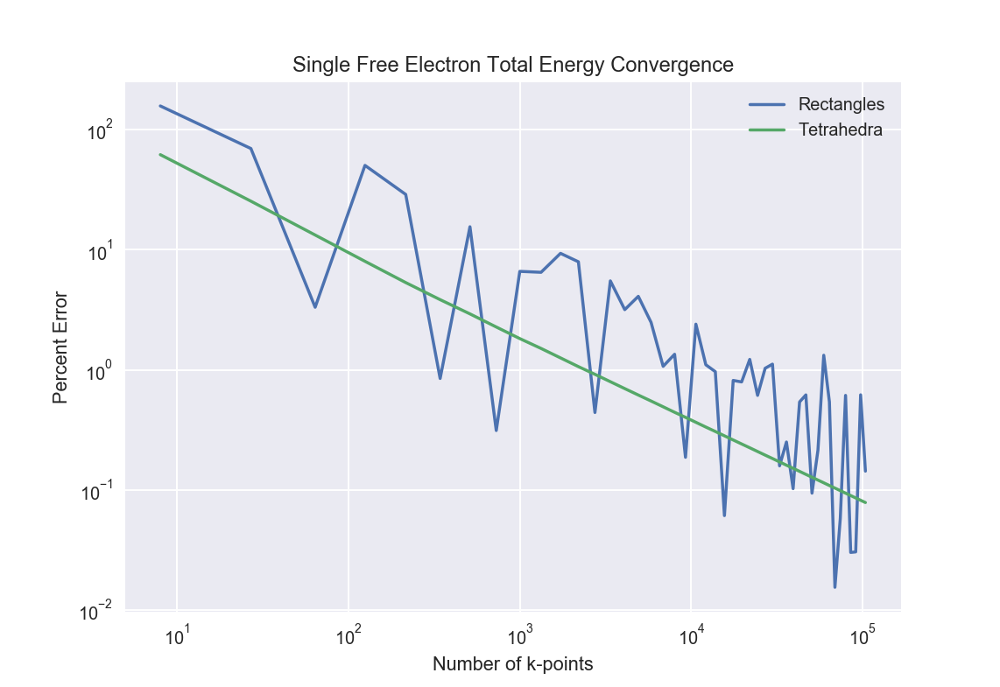

('Divisions ', 2)
('run time', 0.006975889205932617)
('Divisions ', 3)
('run time', 0.015714168548583984)
('Divisions ', 4)
('run time', 0.0341341495513916)
('Divisions ', 5)
('run time', 0.06642889976501465)
('Divisions ', 6)
('run time', 0.10963892936706543)
('Divisions ', 7)
('run time', 0.17060518264770508)
('Divisions ', 8)
('run time', 0.26164698600769043)
('Divisions ', 9)
('run time', 0.3871278762817383)
('Divisions ', 10)
('run time', 0.49952220916748047)
('Divisions ', 11)
('run time', 0.7039570808410645)
('Divisions ', 12)
('run time', 0.9570860862731934)
('Divisions ', 13)
('run time', 1.0978009700775146)
('Divisions ', 14)
('run time', 1.394515037536621)
('Divisions ', 15)
('run time', 1.718493938446045)
('Divisions ', 16)
('run time', 2.110476016998291)
('Divisions ', 17)
('run time', 2.5448408126831055)
('Divisions ', 18)
('run time', 2.8041739463806152)
('Divisions ', 19)
('run time', 3.423586130142212)
('Divisions ', 20)
('run time', 4.046413898468018)
('Divisions ', 2

In [44]:
ndivisions = range(2, 48)
degree = 2
exact_fl = True
err_correlation = False
improved = False
symmetry = False
file_names = ["temp_fl", "tet_rec_dense_conv2", "err_correlation_dense2"]
PP_name = "Single Free Electron"
location = "/Users/jeremyjorgensen/Codes/BZI/plots"
create_convergence_plot(free_PP, ndivisions, degree, exact_fl, improved, symmetry,
                        PP_name, file_names, location, err_correlation)


# def create_convergence_plot(PP, ndivisions, degree, exact_fl, improved, symmetry,
#                             PP_name, file_names, location, err_correlation=False):


## Third degree

### Band Plot

<IPython.core.display.Javascript object>


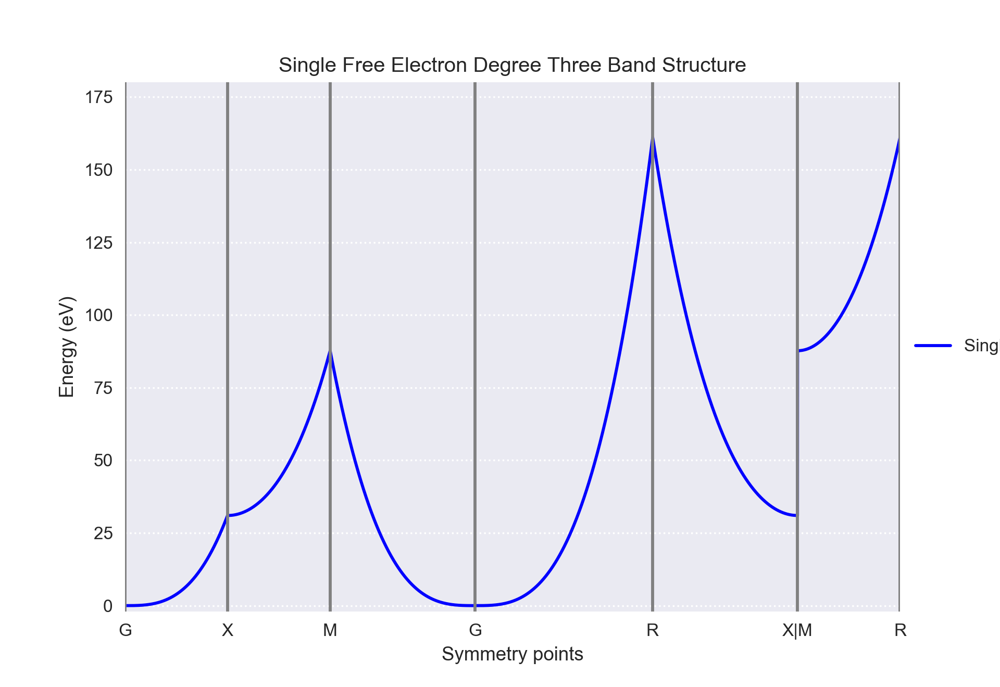

In [12]:
free_PP.set_degree(3)
free_energy_shift = free_PP.eval([0.]*3,1)[0]
free_args = {"materials_list": ["Single Free Electron Degree Three"],
           "PPlist": [free_PP],
           "PPargs_list": [{"neigvals": 1}],
           "lattice": free_PP.lattice,
           "npts": 1000,
           "neigvals": 1,
           "energy_shift": free_energy_shift,
           "energy_limits": [-2,180],
           "show": True}
plot_band_structure(**free_args)

<IPython.core.display.Javascript object>


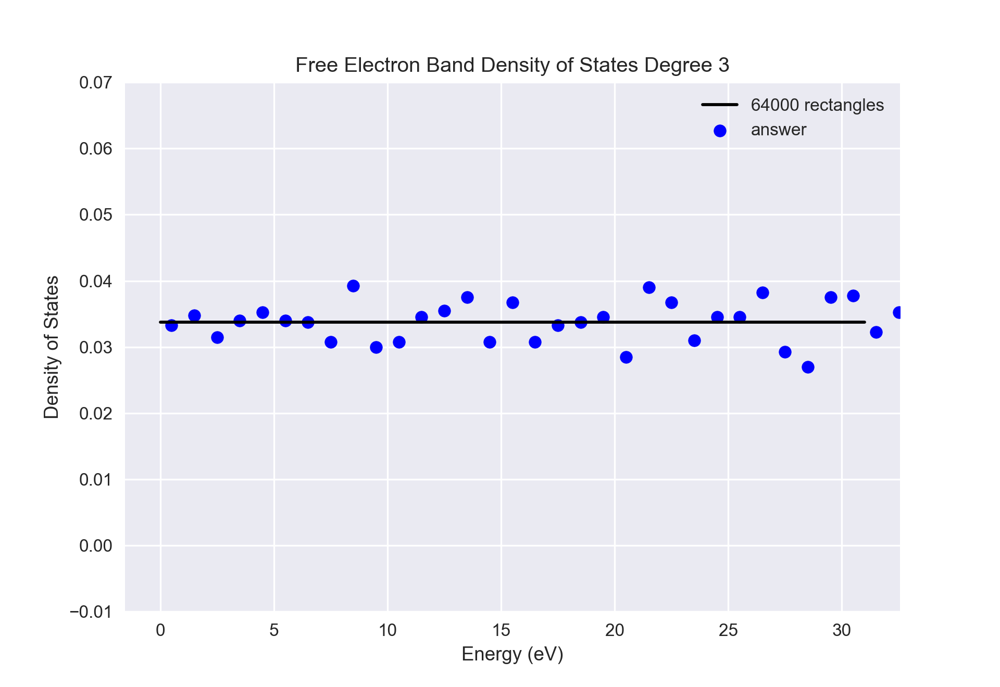

In [52]:
free_PP.set_degree(3)
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

rec_dos_args = {"PP": free_PP,
                "grid": rec_grid,
                "tetrahedra":None,
                "weights": None,
                "method": "rectangles",
                "energy_list": energy_list,
                "quantity": "dos",
                "nbands": 1,
                "answer": free_dos,
                "title": "Free Electron Band Density of States Degree 3",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 0.07],
                "labels": ["%i rectangles"%len(rec_grid), "answer"],
                "bin_size": 1,
                "save": "rectangles_DOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Single Free Electron/degree_3/")}
plot_states(**rec_dos_args)

<IPython.core.display.Javascript object>


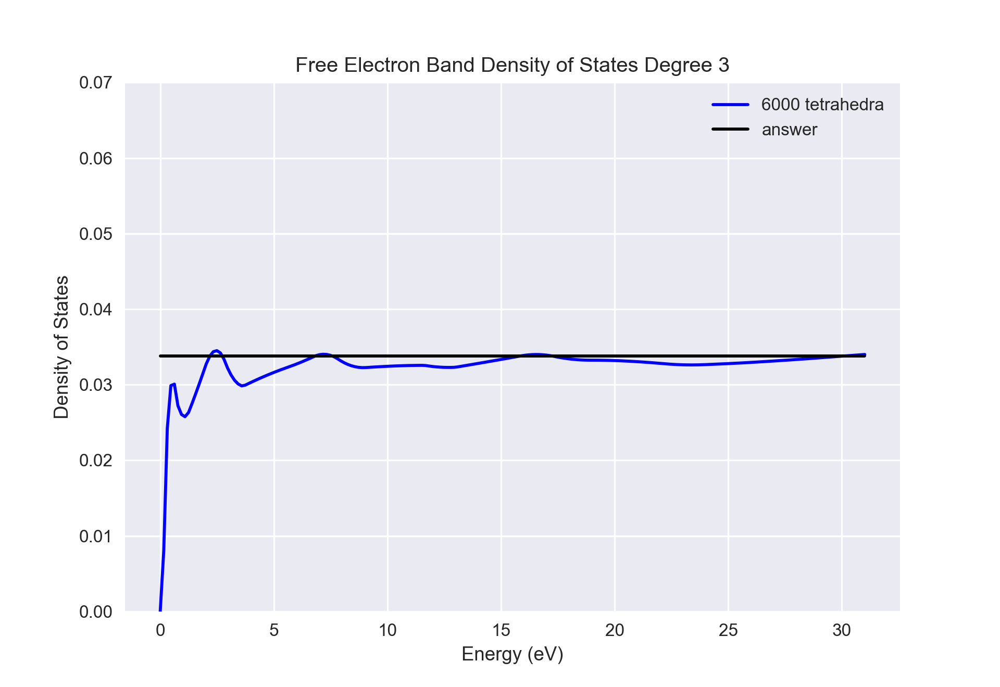

In [53]:
free_PP.set_degree(3)
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

tet_dos_args = {"PP": free_PP,
                "grid": tet_grid,
                "tetrahedra": tetrahedra,
                "weights": weights,
                "method": "tetrahedra",
                "energy_list": energy_list,
                "quantity": "dos",
                "nbands": 1,
                "answer": free_dos,
                "title": "Free Electron Band Density of States Degree 3",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [0.0, 0.07],
                "labels": ["%i tetrahedra"%np.sum(weights), "answer"],
                "save": "tetrahedra_DOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Single Free Electron/degree_3/")}
plot_states(**tet_dos_args)

<IPython.core.display.Javascript object>


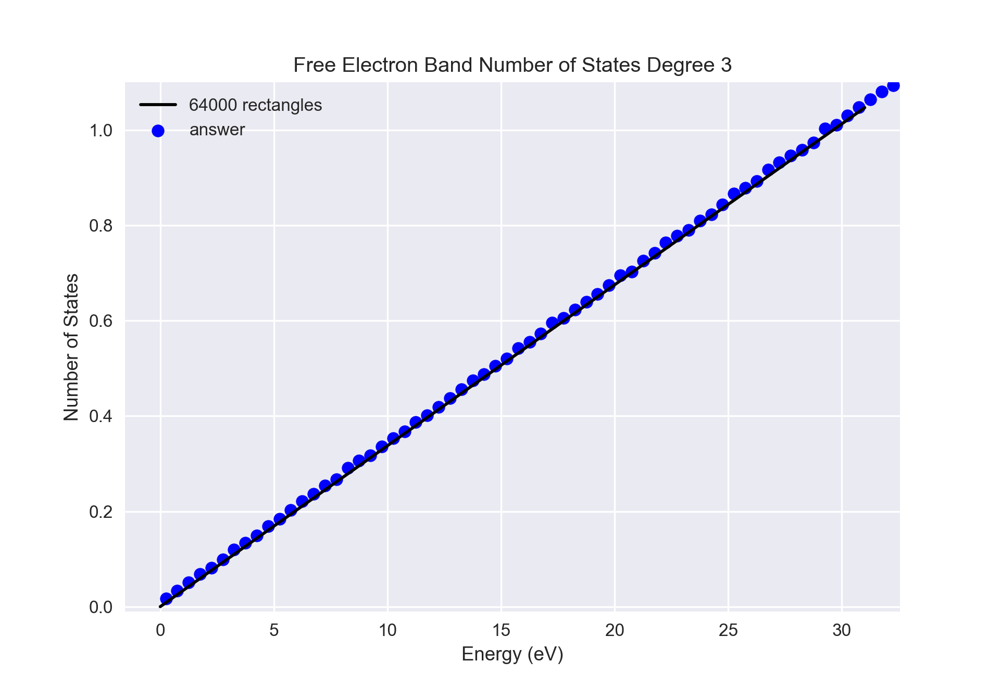

In [40]:
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(3)
rec_nos_args = {"PP": free_PP,
                "grid": rec_grid,
                "tetrahedra":None,
                "weights": None,
                "method": "rectangles",
                "energy_list": energy_list,
                "quantity": "nos",
                "nbands": 1,
                "answer": free_nos,
                "title": "Free Electron Band Number of States Degree 3",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 1.1],
                "labels": ["%i rectangles"%len(rec_grid), "answer"],
                "bin_size": 0.5,
                "save": "rectangles_NOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Single Free Electron/degree_3/")}
plot_states(**rec_nos_args)

<IPython.core.display.Javascript object>


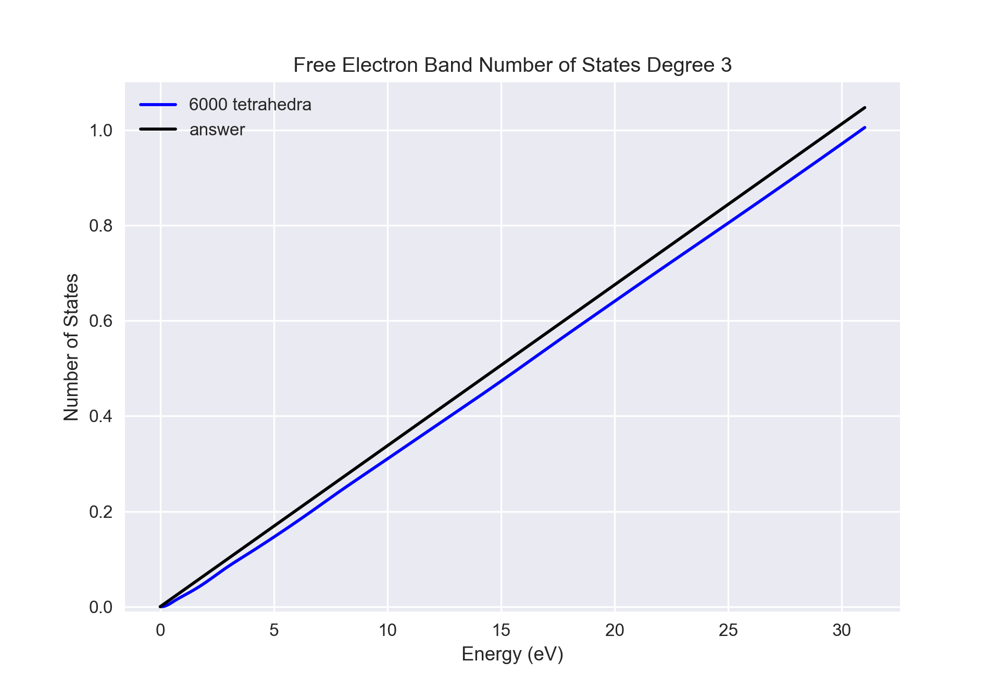

In [41]:
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(3)
tet_nos_args = {"PP": free_PP,
                "grid": tet_grid,
                "tetrahedra": tetrahedra,
                "weights": weights,
                "method": "tetrahedra",
                "energy_list": energy_list,
                "quantity": "nos",
                "nbands": 1,
                "answer": free_nos,
                "title": "Free Electron Band Number of States Degree 3",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 1.1],
                "labels": ["%i tetrahedra"%np.sum(weights), "answer"],
                "save": "tetrahedra_NOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Single Free Electron/degree_3/")}
plot_states(**tet_nos_args)

### Improved method 

<IPython.core.display.Javascript object>


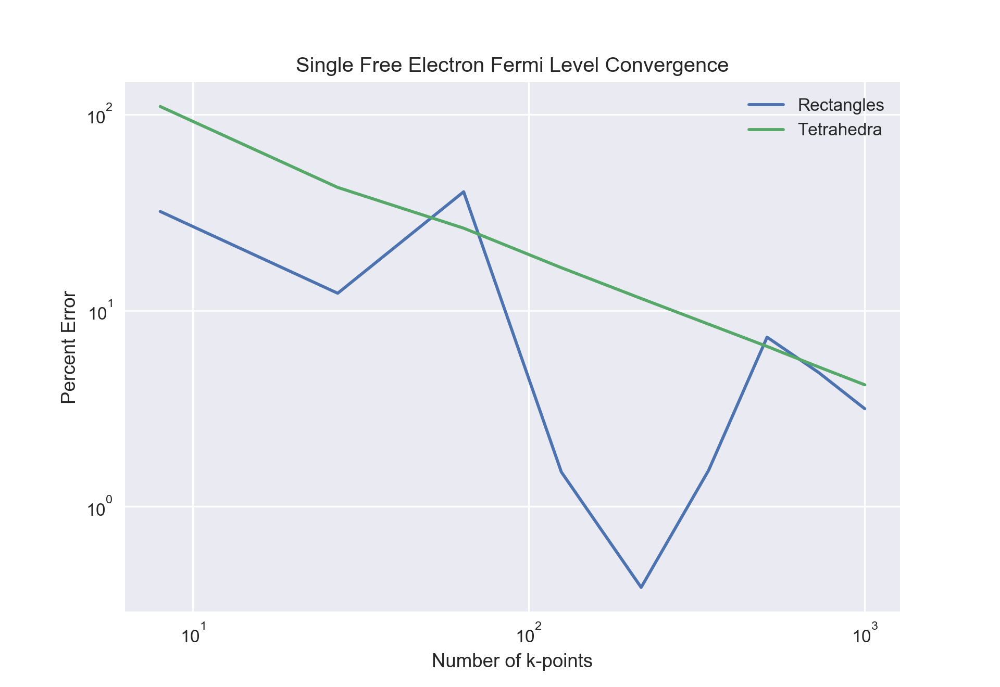

<IPython.core.display.Javascript object>


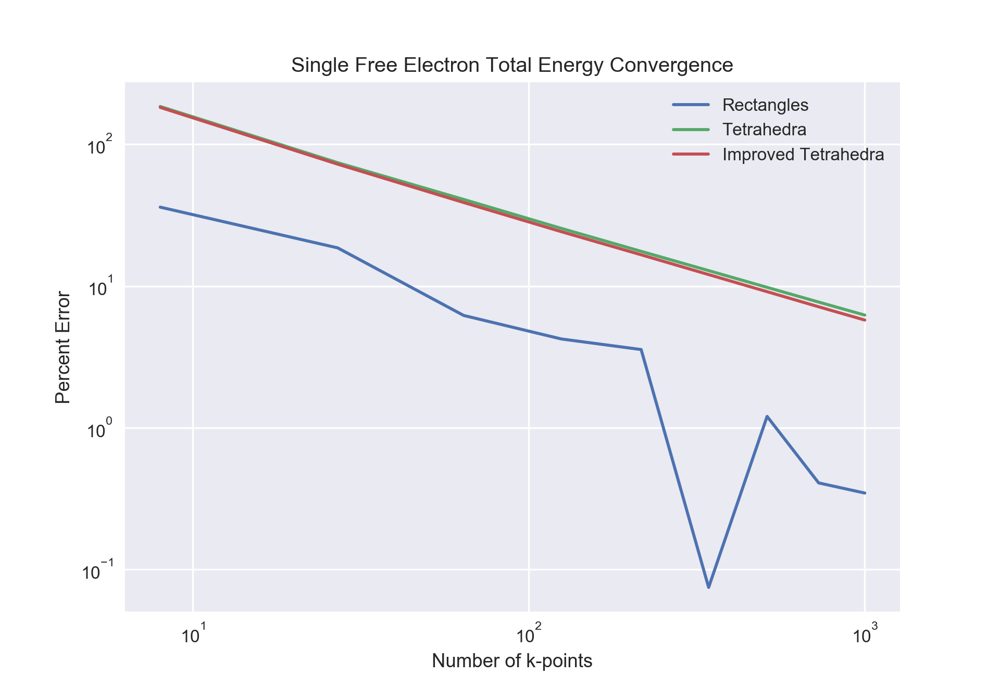

3
('Divisions ', 2)
('run time', 0.5845530033111572)
('Divisions ', 3)
('run time', 2.5273380279541016)
('Divisions ', 4)
('run time', 7.388331890106201)
('Divisions ', 5)
('run time', 16.612756967544556)
('Divisions ', 6)
('run time', 35.491429805755615)
('Divisions ', 7)
('run time', 71.09272480010986)
('Divisions ', 8)
('run time', 139.71170210838318)
('Divisions ', 9)
('run time', 223.11142301559448)
('Divisions ', 10)
('run time', 387.4636929035187)


<IPython.core.display.Javascript object>


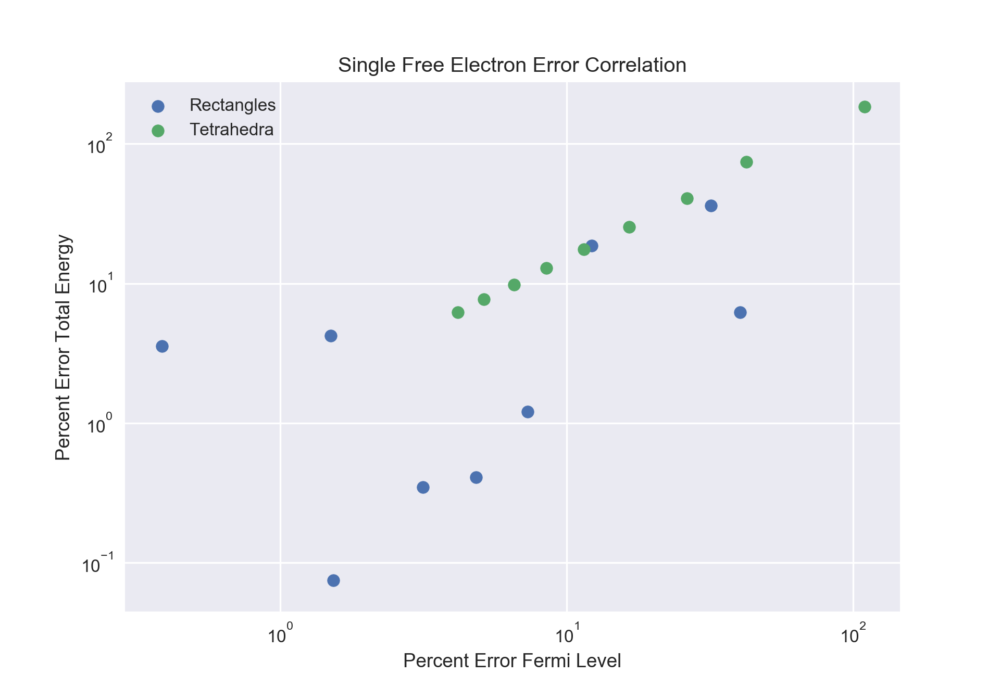

In [5]:
ndivisions = range(2, 11)
degree = 3
exact_fl = False
err_correlation = True
improved = True
symmetry = False
file_names = ["fl_conv1", "improved_te_conv1", "error_correlation1"]
PP_name = "Single Free Electron"
create_convergence_plot(free_PP, ndivisions, degree, exact_fl, improved, symmetry,
                        PP_name, file_names, err_correlation)

### Improved method with fixed Fermi level

<IPython.core.display.Javascript object>


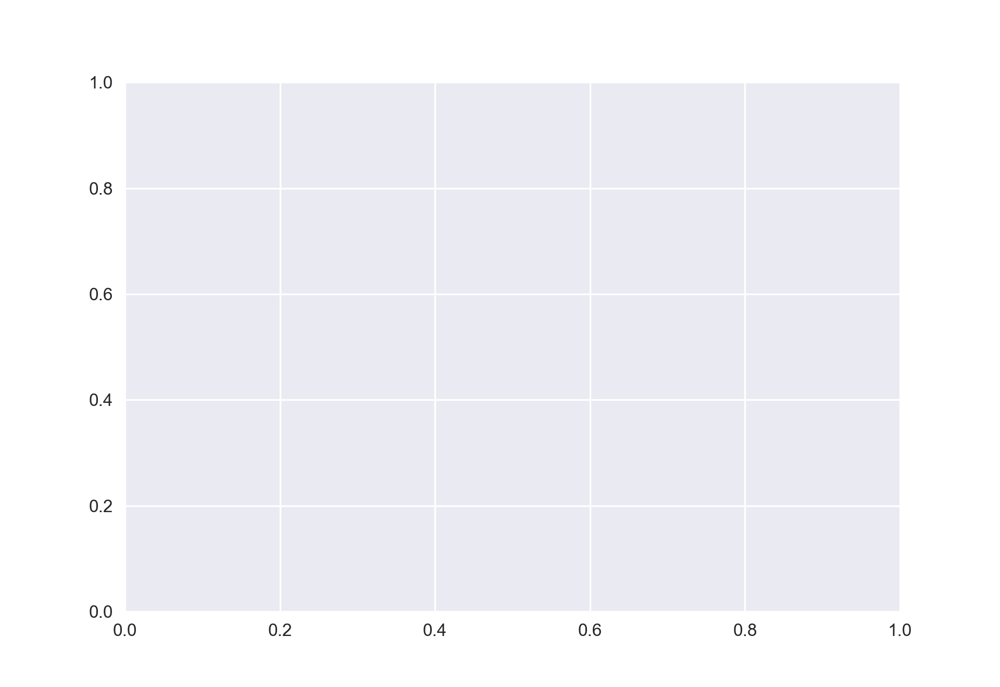

<IPython.core.display.Javascript object>


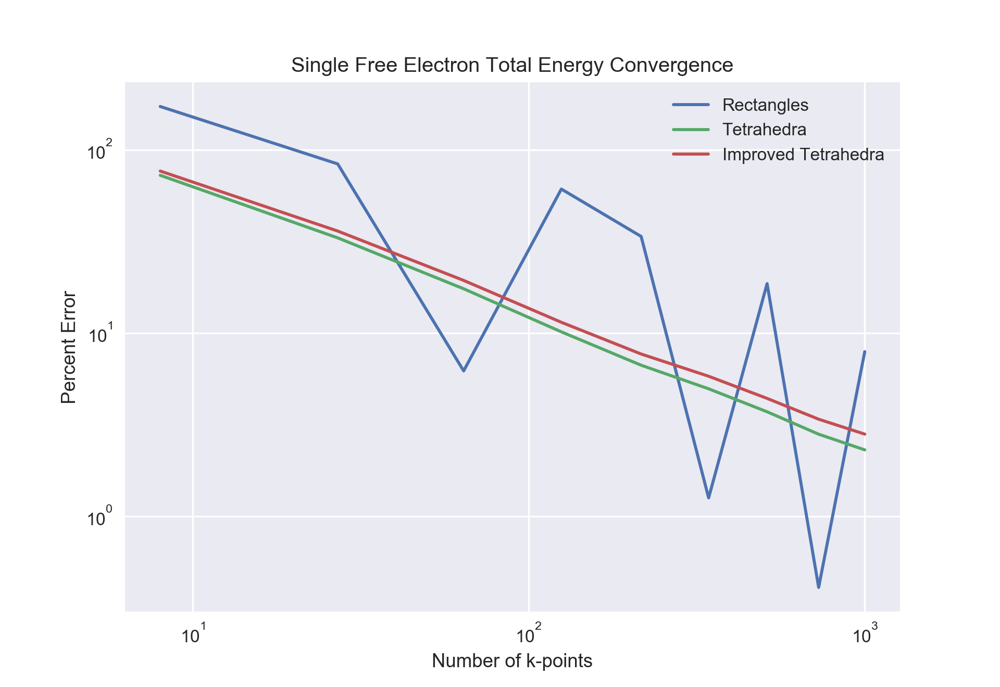

('Divisions ', 2)
('run time', 0.5072000026702881)
('Divisions ', 3)
('run time', 2.1663830280303955)
('Divisions ', 4)
('run time', 5.661273956298828)
('Divisions ', 5)
('run time', 14.677491188049316)
('Divisions ', 6)
('run time', 30.57011103630066)
('Divisions ', 7)
('run time', 62.07582998275757)
('Divisions ', 8)
('run time', 130.7730860710144)
('Divisions ', 9)
('run time', 232.4832649230957)
('Divisions ', 10)
('run time', 377.28784799575806)


In [3]:
ndivisions = range(2, 11)
degree = 3
exact_fl = True
err_correlation = False
improved = True
symmetry = False
file_names = ["temp_fl", "improved_te_fixed_conv1"]
PP_name = "Single Free Electron"
create_convergence_plot(free_PP, ndivisions, degree, exact_fl, improved, symmetry,
                        PP_name, file_names, err_correlation)

## Degree 1

### Band Plot

<IPython.core.display.Javascript object>


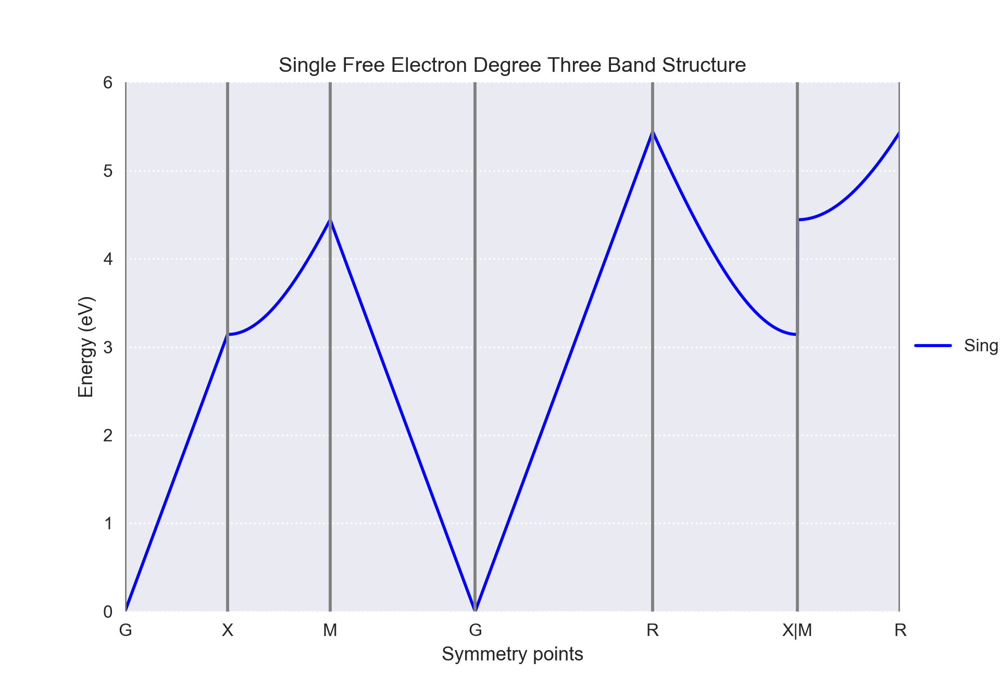

In [5]:
free_PP.set_degree(1)
free_energy_shift = free_PP.eval([0.]*3,1)[0]
free_args = {"materials_list": ["Single Free Electron Degree Three"],
             "PPlist": [free_PP],
             "PPargs_list": [{"neigvals": 1}],
             "lattice": free_PP.lattice,
             "npts": 1000,
             "neigvals": 1,
             "energy_shift": free_energy_shift,
             "energy_limits": [0,6],
             "show": True,
             "save":True}
plot_band_structure(**free_args)

<IPython.core.display.Javascript object>


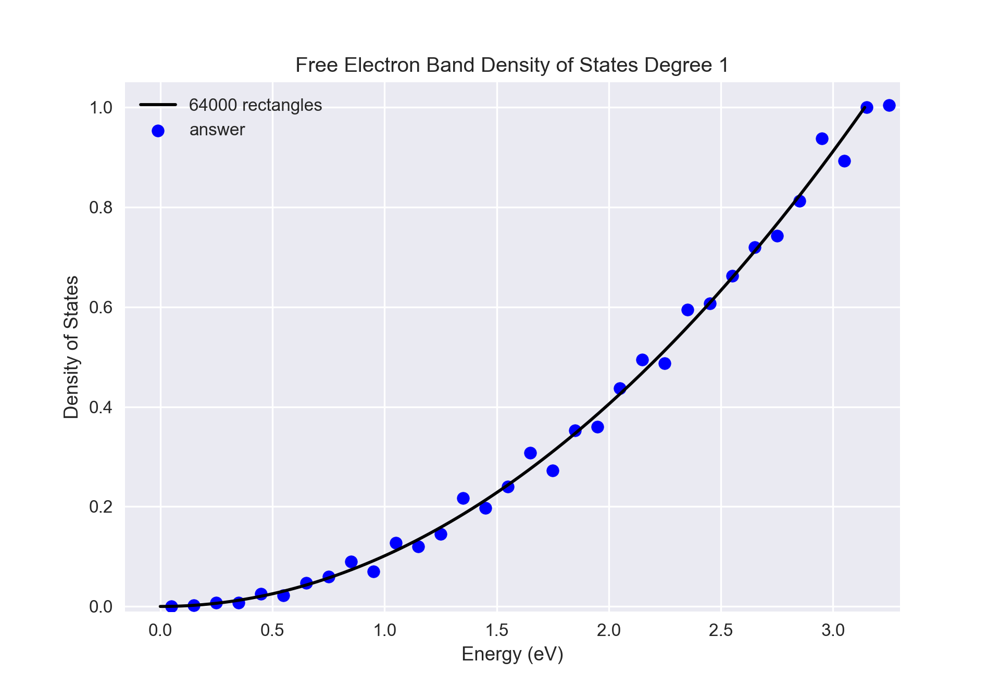

In [47]:
free_PP.set_degree(1)
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

rec_dos_args = {"PP": free_PP,
                "grid": rec_grid,
                "tetrahedra":None,
                "weights": None,
                "method": "rectangles",
                "energy_list": energy_list,
                "quantity": "dos",
                "nbands": 1,
                "answer": free_dos,
                "title": "Free Electron Band Density of States Degree 1",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 1.05],
                "labels": ["%i rectangles"%len(rec_grid), "answer"],
                "bin_size": 0.1,
                "save": "rectangles_DOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Single Free Electron/degree_1/")}
plot_states(**rec_dos_args)

<IPython.core.display.Javascript object>


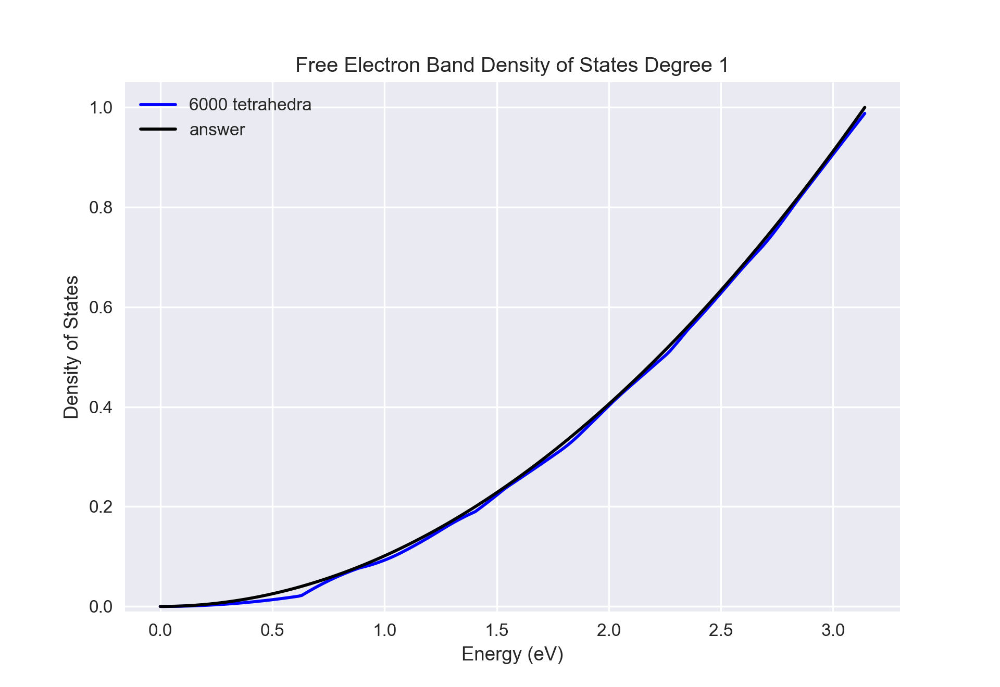

In [48]:
free_PP.set_degree(1)
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

tet_dos_args = {"PP": free_PP,
                "grid": tet_grid,
                "tetrahedra": tetrahedra,
                "weights": weights,
                "method": "tetrahedra",
                "energy_list": energy_list,
                "quantity": "dos",
                "nbands": 1,
                "answer": free_dos,
                "title": "Free Electron Band Density of States Degree 1",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 1.05],
                "labels": ["%i tetrahedra"%np.sum(weights), "answer"],
                "save": "tetrahedra_DOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Single Free Electron/degree_1/")}
plot_states(**tet_dos_args)

<IPython.core.display.Javascript object>


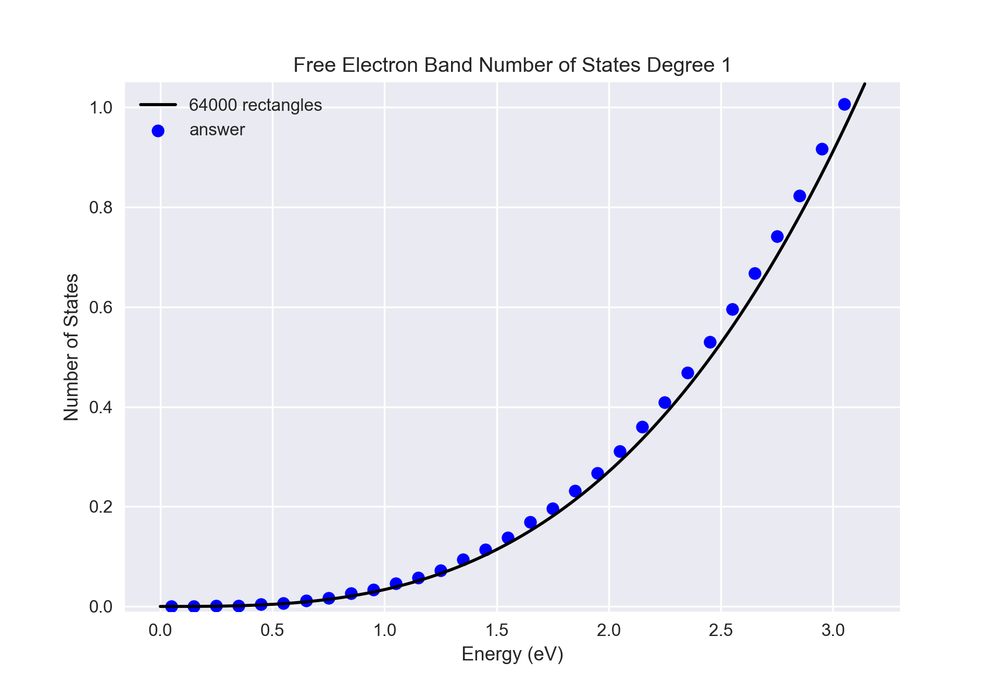

In [50]:
free_PP.set_degree(1)
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

rec_nos_args = {"PP": free_PP,
                "grid": rec_grid,
                "tetrahedra":None,
                "weights": None,
                "method": "rectangles",
                "energy_list": energy_list,
                "quantity": "nos",
                "nbands": 1,
                "answer": free_nos,
                "title": "Free Electron Band Number of States Degree 1",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 1.05],
                "labels": ["%i rectangles"%len(rec_grid), "answer"],
                "bin_size": 0.1,
                "save": "rectangles_NOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Single Free Electron/degree_1/")}
plot_states(**rec_nos_args)

<IPython.core.display.Javascript object>


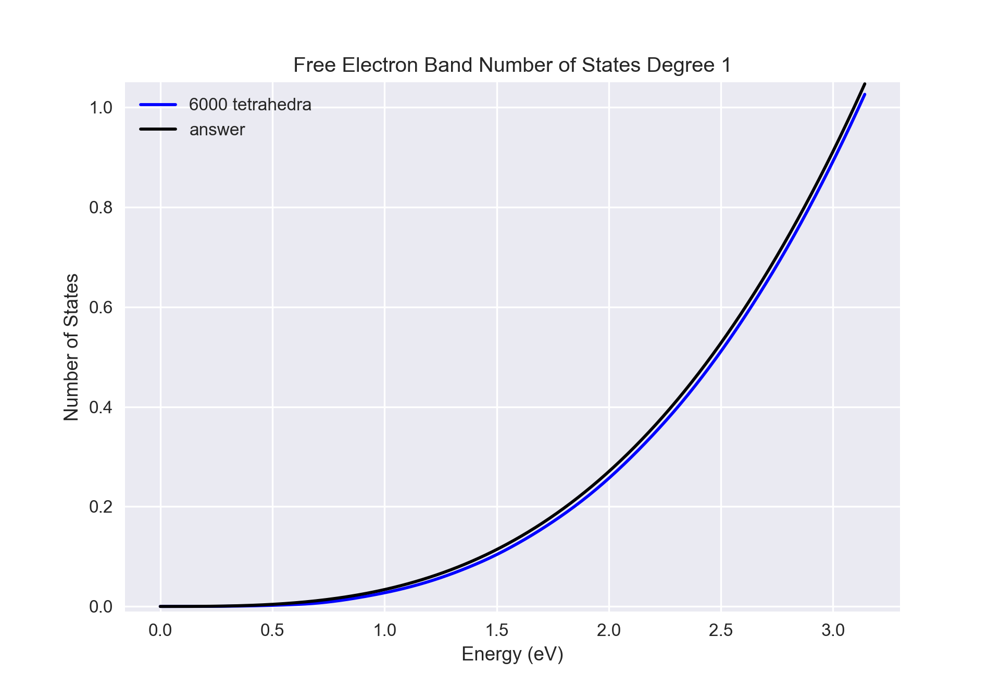

In [51]:
free_PP.set_degree(1)
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

tet_nos_args = {"PP": free_PP,
                "grid": tet_grid,
                "tetrahedra": tetrahedra,
                "weights": weights,
                "method": "tetrahedra",
                "energy_list": energy_list,
                "quantity": "nos",
                "nbands": 1,
                "answer": free_nos,
                "title": "Free Electron Band Number of States Degree 1",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 1.05],
                "labels": ["%i tetrahedra"%np.sum(weights), "answer"],
                "save": "tetrahedra_NOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Single Free Electron/degree_1/")}
plot_states(**tet_nos_args)

### Convergence Plots for first degree

<IPython.core.display.Javascript object>


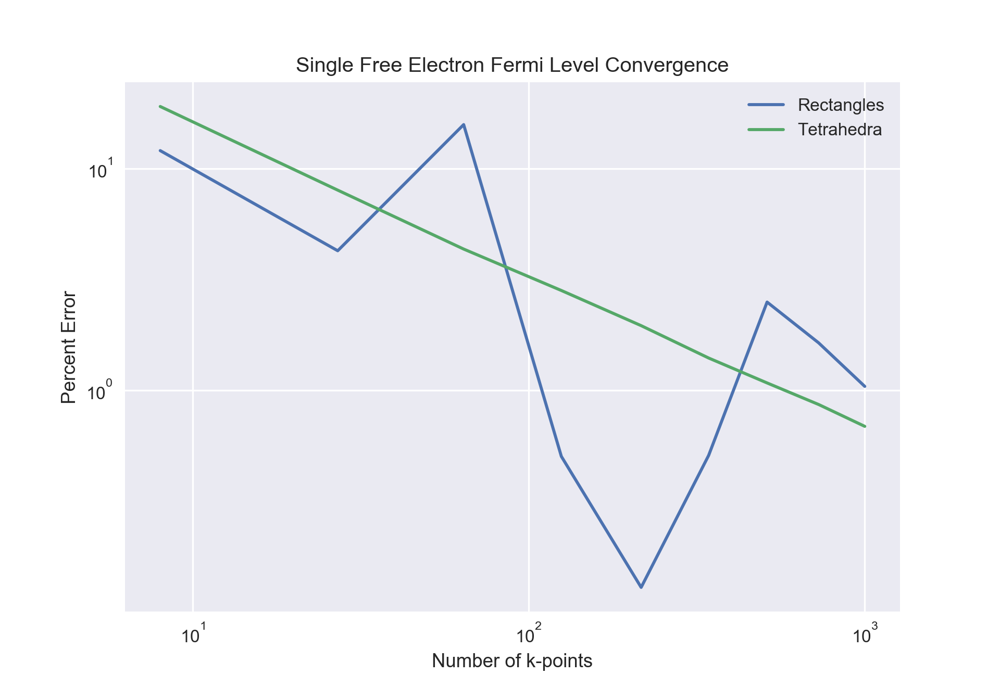

<IPython.core.display.Javascript object>


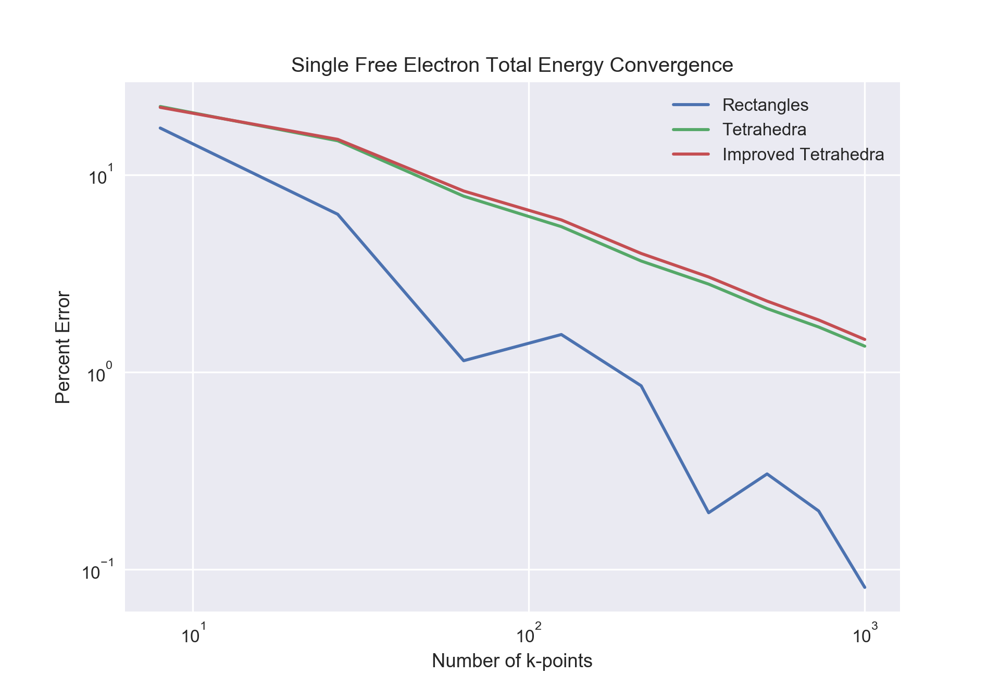

('Divisions ', 2)
('run time', 0.5946450233459473)
('Divisions ', 3)
('run time', 2.2513480186462402)
('Divisions ', 4)
('run time', 6.291806936264038)
('Divisions ', 5)
('run time', 14.96750807762146)
('Divisions ', 6)
('run time', 34.992342948913574)
('Divisions ', 7)
('run time', 74.631520986557)
('Divisions ', 8)
('run time', 142.85970520973206)
('Divisions ', 9)
('run time', 239.53844904899597)
('Divisions ', 10)
('run time', 415.55867195129395)


<IPython.core.display.Javascript object>


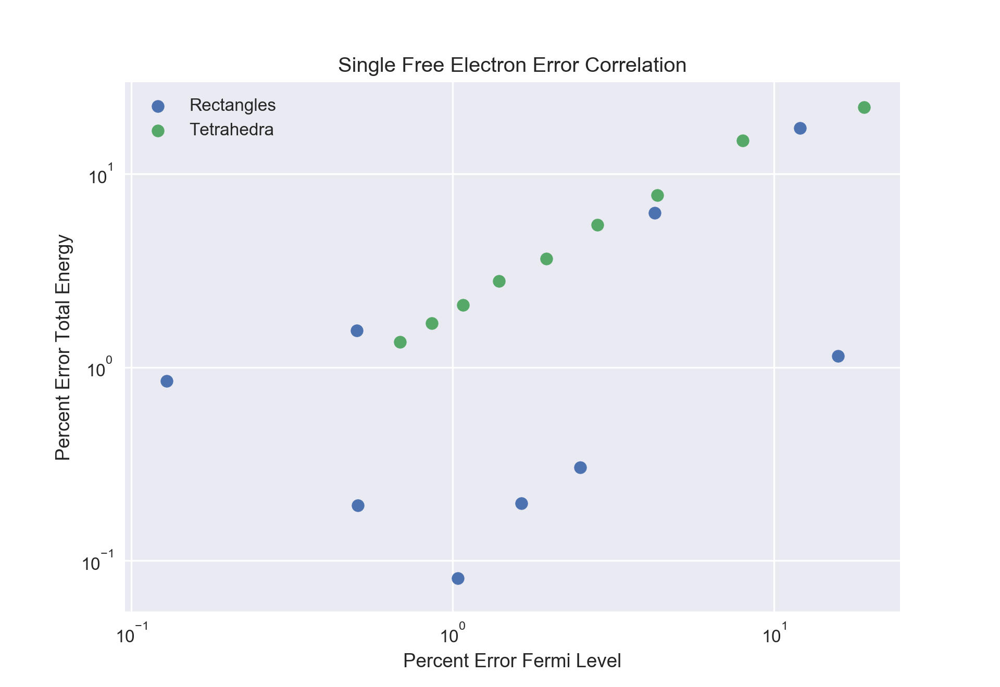

('total elapsed time: ', 15.552935401598612, ' minutes')


In [54]:
ndivisions = range(2, 11)
degree = 1
exact_fl = False
err_correlation = True
improved = True
symmetry = False
file_names = ["fl_conv1", "improved_te_conv1", "error_correlation1"]
PP_name = "Single Free Electron"
create_convergence_plot(free_PP, ndivisions, degree, exact_fl, improved, symmetry,
                        PP_name, file_names, err_correlation)

<IPython.core.display.Javascript object>


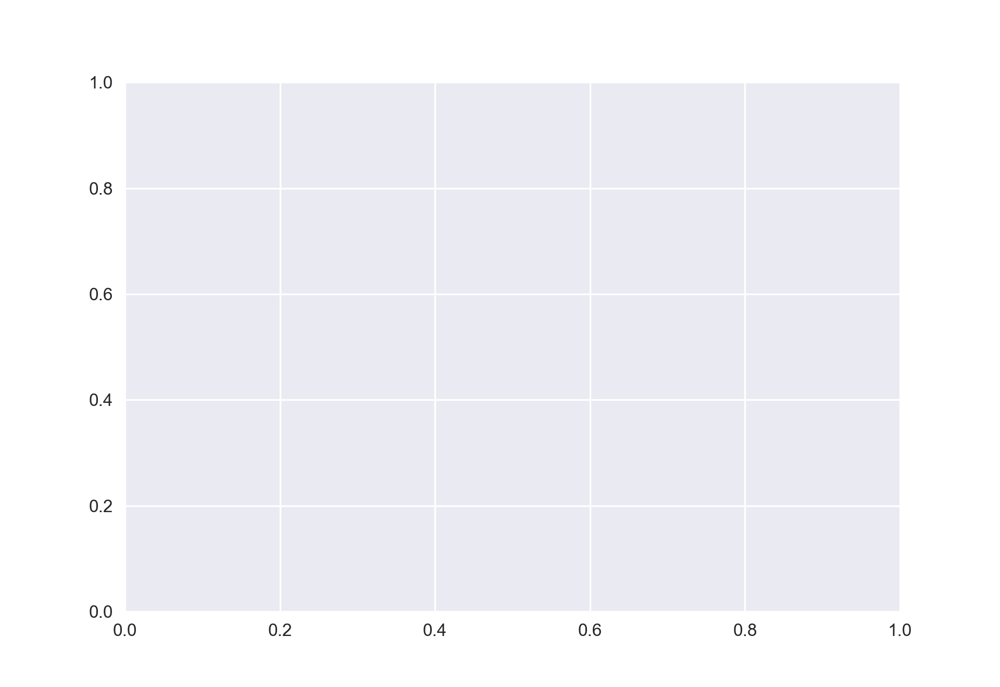

<IPython.core.display.Javascript object>


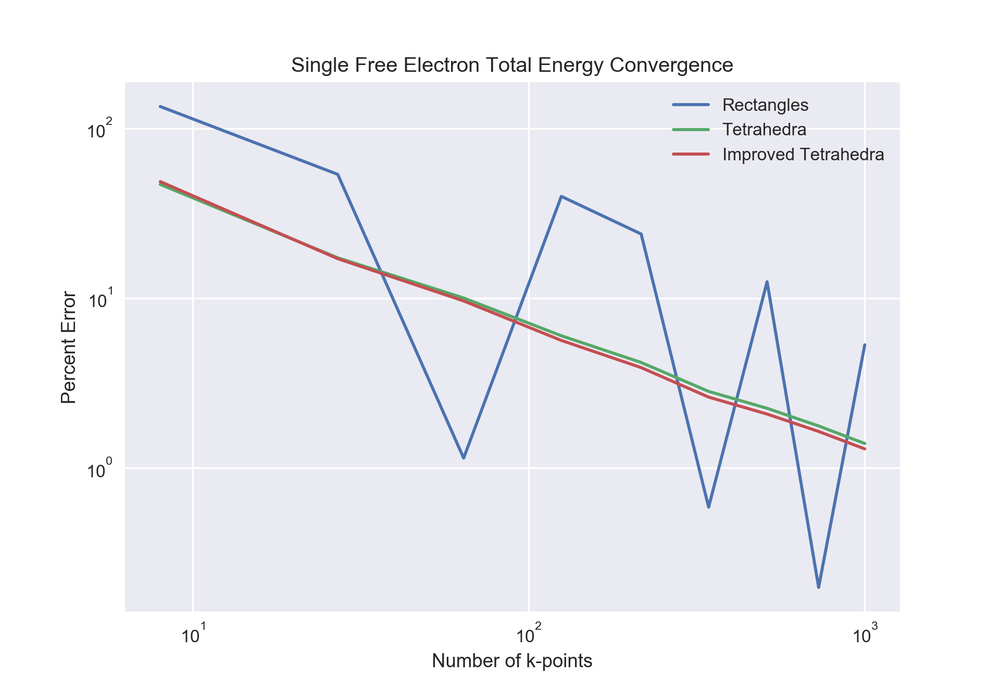

('Divisions ', 2)
('run time', 0.5366699695587158)
('Divisions ', 3)
('run time', 1.996631145477295)
('Divisions ', 4)
('run time', 6.079496145248413)
('Divisions ', 5)
('run time', 15.20659613609314)
('Divisions ', 6)
('run time', 33.02880811691284)
('Divisions ', 7)
('run time', 67.44463682174683)
('Divisions ', 8)
('run time', 124.24073791503906)
('Divisions ', 9)
('run time', 222.03105807304382)
('Divisions ', 10)
('run time', 368.51088309288025)
('total elapsed time: ', 13.990788129965464, ' minutes')


In [55]:
ndivisions = range(2, 11)
degree = 1
exact_fl = True
err_correlation = False
improved = True
symmetry = False
file_names = ["temp", "improved_te_fixed_conv1"]
PP_name = "Single Free Electron"
create_convergence_plot(free_PP, ndivisions, degree, exact_fl, improved, symmetry,
                        PP_name, file_names, err_correlation)

In [ ]:
# Lorentzian smoothing
def lorentz_smoothing(pos, peak, width, shift):
    """A Lorenzian smoothing function that should help with
    calculating density of states.
    
    pos (float): the position being evaluated
    peak (float): the maximum value at the peak
    width (float): the full width at half maximum value
    shift (float): the position of the peak
    """
    x = (shift - pos)/(w/2)
    return 1/(1 + x**2)
    
    
def gauss_smoothing
    """A Gaussian smoothing function that should help with
    calculating density of states.
    
    pos (float): the position being evaluated
    peak (float): the maximum value at the peak
    width (float): the full width at half maximum value
    shift (float): the position of the peak
    """

## Multiple Free Electron Bands

### Band plot

<IPython.core.display.Javascript object>


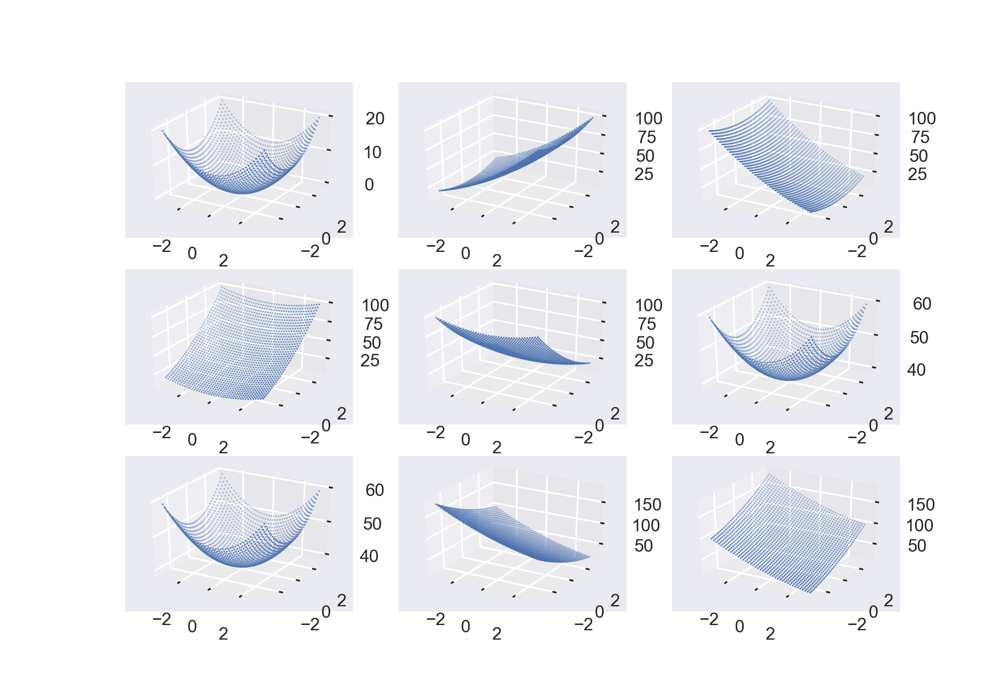

In [88]:
states = range(9)
nbands = 12
ndivisions = 40
grid_vectors = [0, 1]
plane_value = .5
offset = -np.sum(multiple_free_PP.lattice.reciprocal_vectors, 1)/2

grid = scatter_plot_pp(multiple_free_PP, states, nbands,
                       ndivisions, grid_vectors, plane_value,
                       offset)

<IPython.core.display.Javascript object>


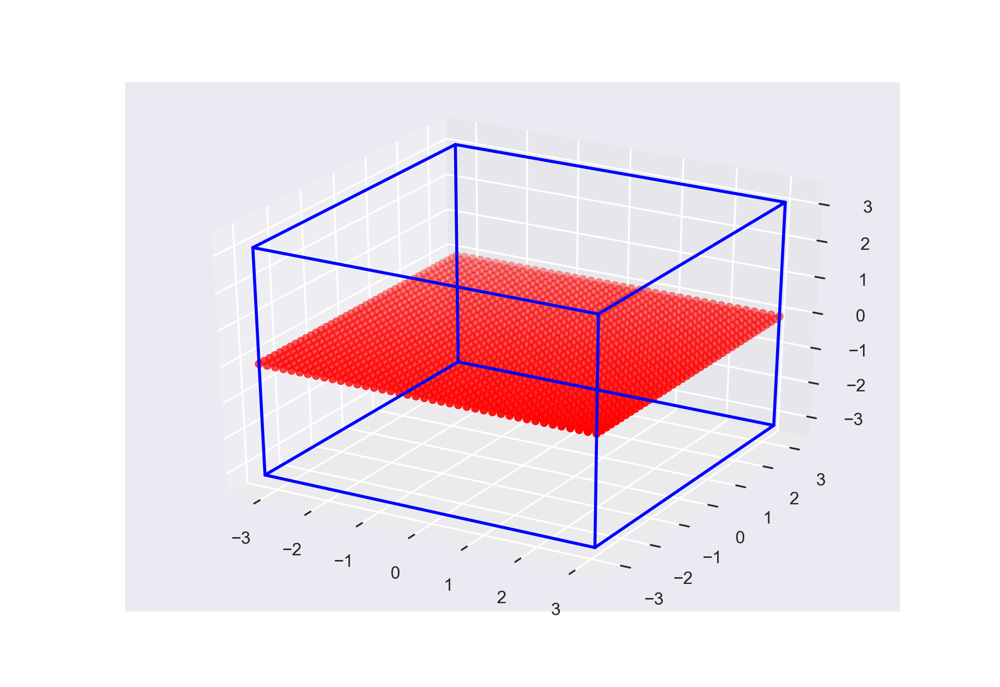

In [89]:
plot_offset = -np.sum(multiple_free_PP.lattice.reciprocal_vectors, 1)/2
plot_mesh(grid, multiple_free_PP.lattice.reciprocal_vectors, plot_offset)

### Degree 2

#### Density of states

<IPython.core.display.Javascript object>


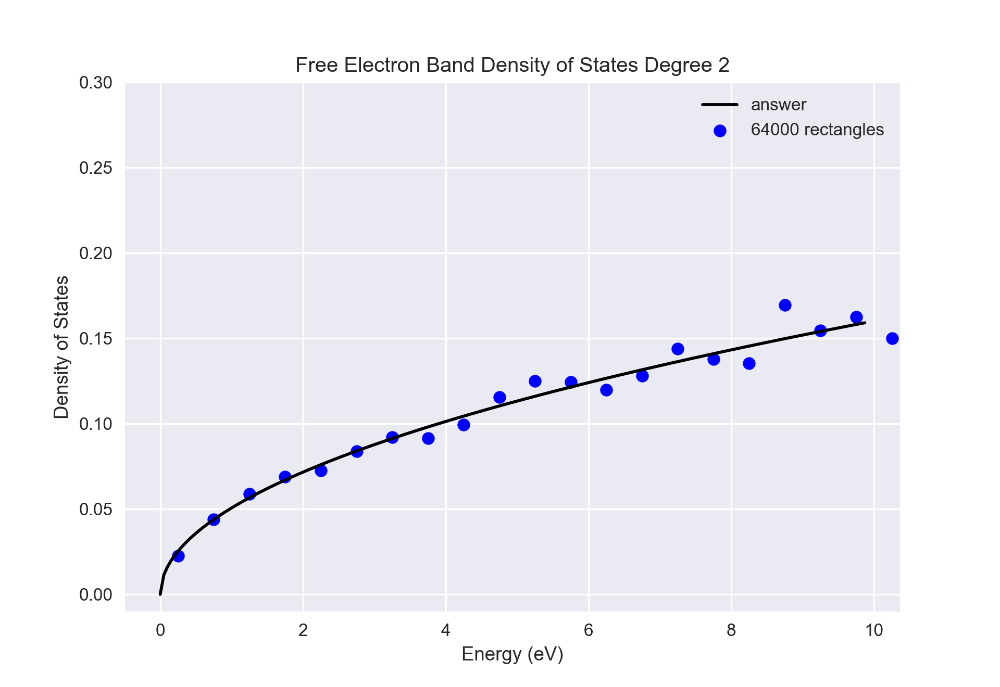

In [17]:
max_energy = np.pi**2
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(2)
rec_dos_args = {"PP": multiple_free_PP,
                "grid": rec_grid,
                "tetrahedra": None,
                "weights": None,
                "method": "rectangles",
                "energy_list": energy_list,
                "quantity": "dos",
                "nbands": 9,
                "answer": free_dos,
                "title": "Free Electron Band Density of States Degree 2",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 0.3],
                "labels": ["%i rectangles"%len(rec_grid), "answer"],
                "bin_size": .5,
                "save": "rectangles_DOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Multiple Free Electron/degree_2/")}
plot_states(**rec_dos_args)

<IPython.core.display.Javascript object>


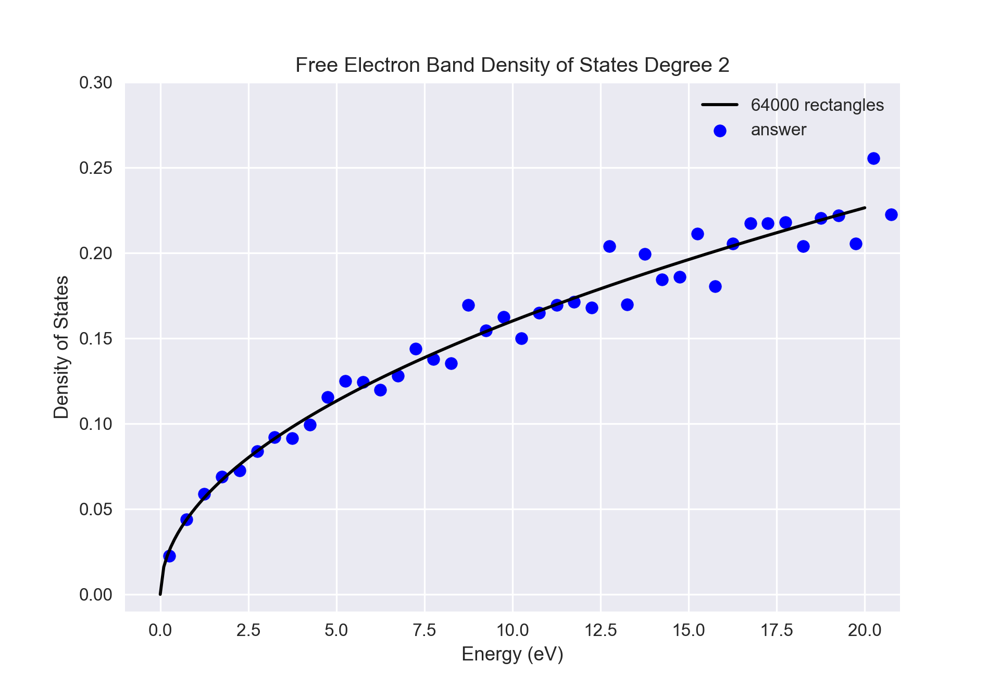

In [102]:
max_energy = 20
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(2)
rec_dos_args = {"PP": multiple_free_PP,
                "grid": rec_grid,
                "tetrahedra": None,
                "weights": None,
                "method": "rectangles",
                "energy_list": energy_list,
                "quantity": "dos",
                "nbands": 9,
                "answer": free_dos,
                "title": "Free Electron Band Density of States Degree 2",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 0.3],
                "labels": ["%i rectangles"%len(rec_grid), "answer"],
                "bin_size": .5,
                "save": "rectangles_DOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Multiple Free Electron/degree_2/")}
plot_states(**rec_dos_args)

<IPython.core.display.Javascript object>


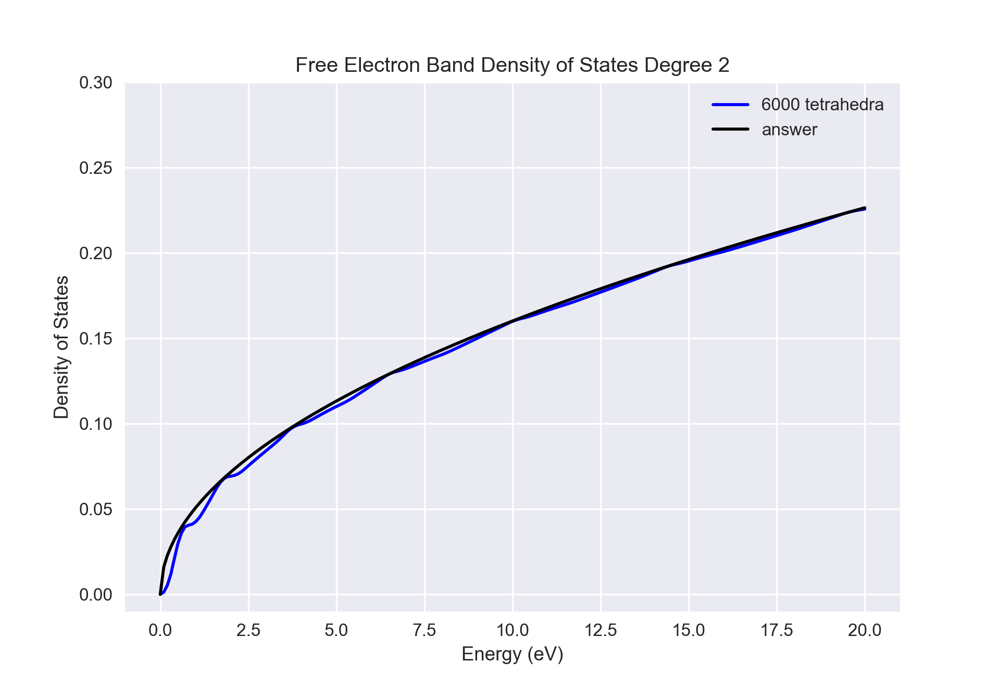

In [119]:
max_energy = 20
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(2)
tet_dos_args = {"PP": multiple_free_PP,
                "grid": tet_grid,
                "tetrahedra": tetrahedra,
                "weights": weights,
                "method": "tetrahedra",
                "energy_list": energy_list,
                "quantity": "dos",
                "nbands": 9,
                "answer": free_dos,
                "title": "Free Electron Band Density of States Degree 2",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 0.3],
                "labels": ["%i tetrahedra"%np.sum(weights), "answer"],
                "bin_size": .5,
                "save": "tetrahedra_DOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Multiple Free Electron/degree_2/")}
plot_states(**tet_dos_args)

<IPython.core.display.Javascript object>


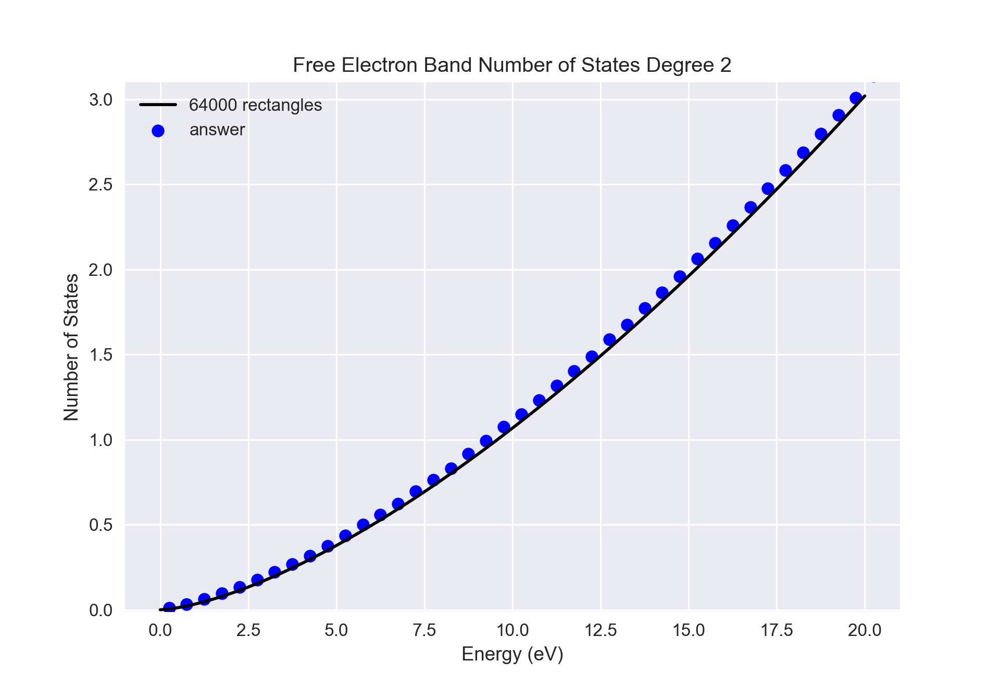

In [121]:
max_energy = 20
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(2)
rec_nos_args = {"PP": multiple_free_PP,
                "grid": rec_grid,
                "tetrahedra": None,
                "weights": None,
                "method": "rectangles",
                "energy_list": energy_list,
                "quantity": "nos",
                "nbands": 9,
                "answer": free_nos,
                "title": "Free Electron Band Number of States Degree 2",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 3.1],
                "labels": ["%i rectangles"%len(rec_grid), "answer"],
                "bin_size": .5,
                "save": "rectangles_NOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Multiple Free Electron/degree_2/")}
plot_states(**rec_nos_args)

<IPython.core.display.Javascript object>


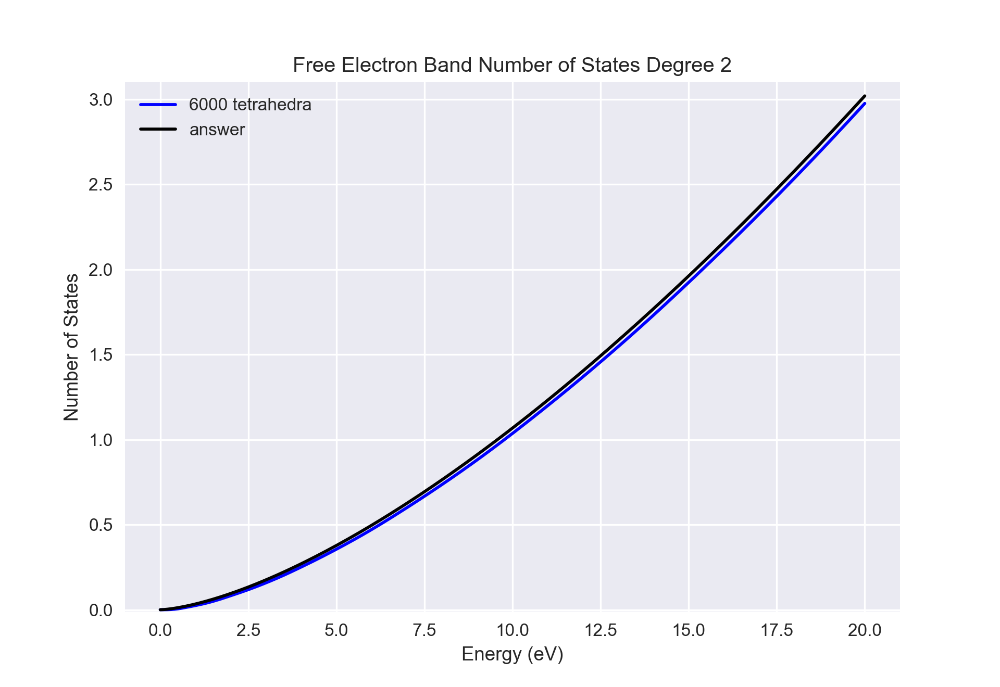

In [122]:
max_energy = 20
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(2)
tet_nos_args = {"PP": multiple_free_PP,
                "grid": tet_grid,
                "tetrahedra": tetrahedra,
                "weights": weights,
                "method": "tetrahedra",
                "energy_list": energy_list,
                "quantity": "nos",
                "nbands": 9,
                "answer": free_nos,
                "title": "Free Electron Band Number of States Degree 2",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 3.1],
                "labels": ["%i tetrahedra"%np.sum(weights), "answer"],
                "bin_size": .5,
                "save": "tetrahedra_NOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Multiple Free Electron/degree_2/")}
plot_states(**tet_nos_args)

### Convergence tests

<IPython.core.display.Javascript object>


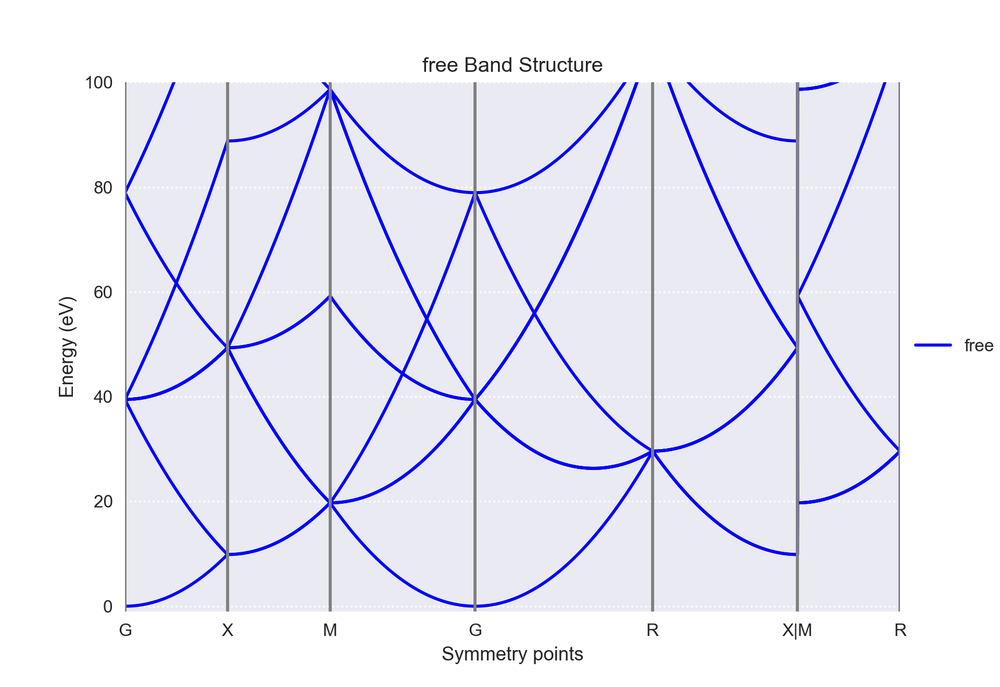

In [123]:
free_energy_shift = free_PP.eval([0.]*3,1)[0]
free_args = {"materials_list": ["free"],
           "PPlist": [multiple_free_PP],
           "PPargs_list": [{"neigvals": 1}],
           "lattice": free_PP.lattice,
           "npts": 1000,
           "neigvals": 9,
           "energy_shift": free_energy_shift,
           "energy_limits": [-1,100],
           "show": True}

plot_band_structure(**free_args)

<IPython.core.display.Javascript object>


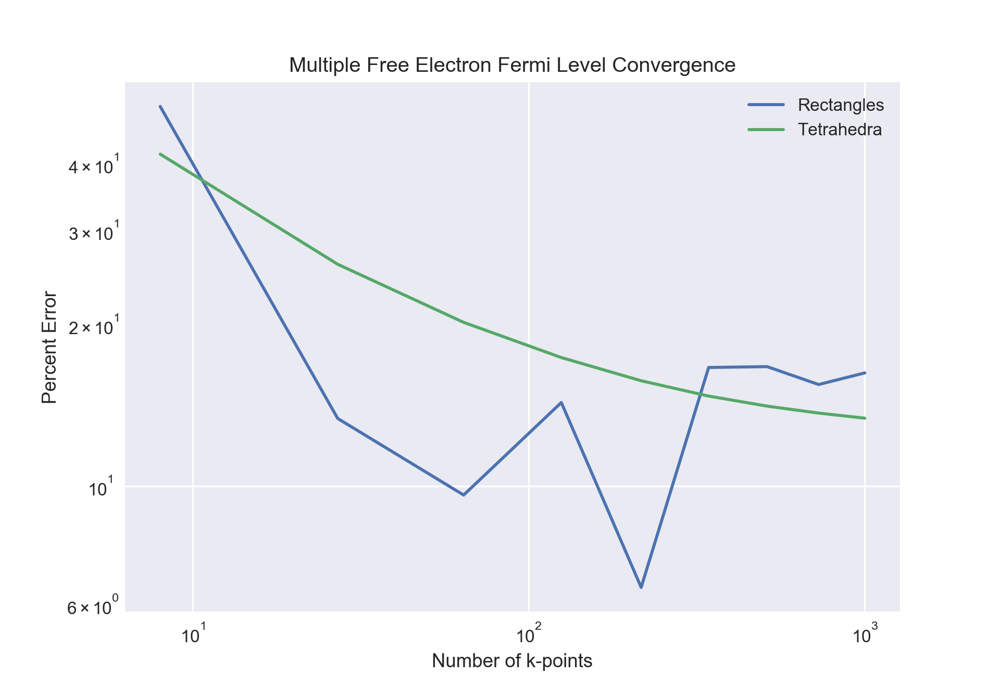

<IPython.core.display.Javascript object>


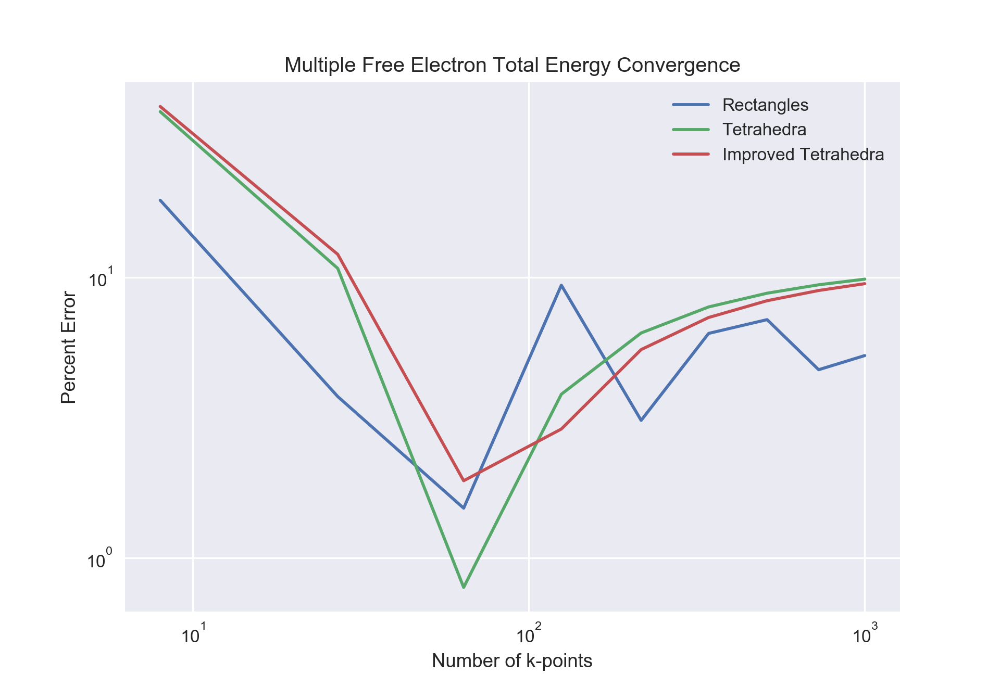

('Divisions ', 2)
('rectangles: ', 7.4022033008170203)
('tetrahedra: ', 21.538125126749705)
('run time', 4.2094340324401855)
('Divisions ', 3)
('rectangles: ', 13.159472534812135)
('tetrahedra: ', 19.141830234915446)
('run time', 14.40959095954895)
('Divisions ', 4)
('rectangles: ', 16.654957426838291)
('tetrahedra: ', 18.268171279818247)
('run time', 32.44822597503662)
('Divisions ', 5)
('rectangles: ', 17.370503745917269)
('tetrahedra: ', 17.835591404825877)
('run time', 66.13767004013062)
('Divisions ', 6)
('rectangles: ', 16.175184990680808)
('tetrahedra: ', 17.584562449843119)
('run time', 123.3262848854065)
('Divisions ', 7)
('rectangles: ', 17.725003822372621)
('tetrahedra: ', 17.431759267241191)
('run time', 214.61413311958313)
('Divisions ', 8)
('rectangles: ', 17.734445408207446)
('tetrahedra: ', 17.33685108938856)
('run time', 344.6251440048218)
('Divisions ', 9)
('rectangles: ', 17.545963379724167)
('tetrahedra: ', 17.27365973511381)
('run time', 546.5414021015167)
('Divisi

<IPython.core.display.Javascript object>


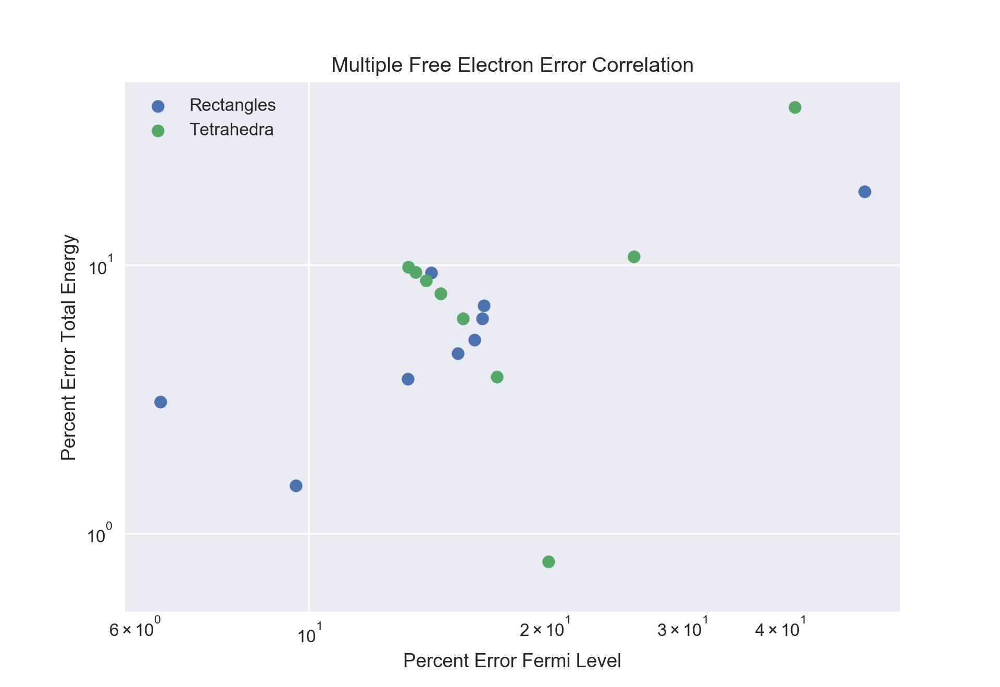

('total elapsed time: ', 36.26920026540756, ' minutes')


In [125]:
conv_args = {"PP": multiple_free_PP,
             "ndivisions": range(2, 11),
             "degree": 2,
             "exact_fl": False,
             "improved": True,
             "symmetry": False,
             "err_correlation": True,
             "file_names": ["fl_convergence", "improved_tet_te_conv1", "error_correlation1"],
             "PP_name": "Multiple Free Electron",
             "location": "/Users/jeremyjorgensen/Codes/BZI/plots/"}

create_convergence_plot(**conv_args)

#### Fixed Fermi level

<IPython.core.display.Javascript object>


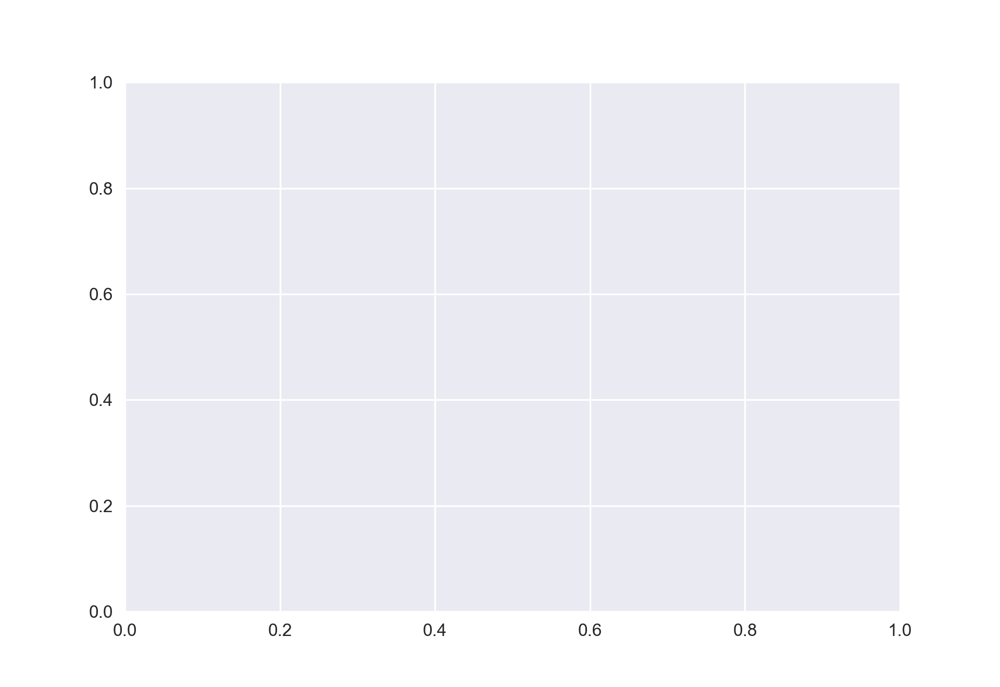

<IPython.core.display.Javascript object>


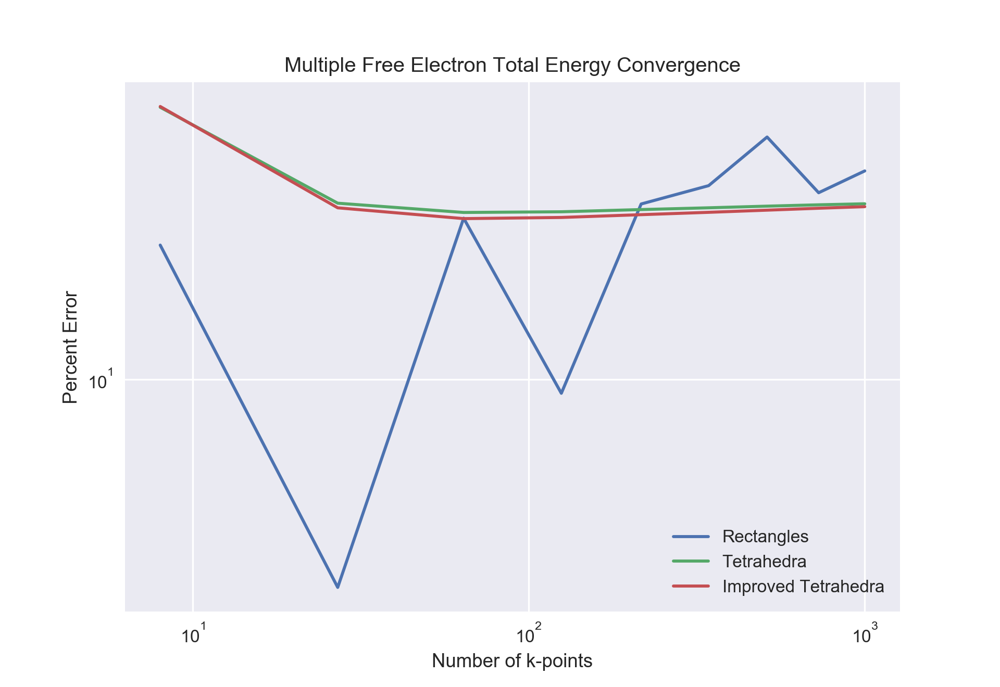

('Divisions ', 2)
('run time', 3.5302510261535645)
('Divisions ', 3)
('run time', 11.473369836807251)
('Divisions ', 4)
('run time', 27.981224060058594)
('Divisions ', 5)
('run time', 57.237865924835205)
('Divisions ', 6)
('run time', 114.4116690158844)
('Divisions ', 7)
('run time', 201.04638695716858)
('Divisions ', 8)
('run time', 331.1847040653229)
('Divisions ', 9)
('run time', 508.34641313552856)
('Divisions ', 10)
('run time', 710.42551612854)
('total elapsed time: ', 32.76613973379135, ' minutes')


In [150]:
multiple_free_PP.set_degree(2)
conv_args = {"PP": multiple_free_PP,
             "ndivisions": range(2, 11),
             "degree": 2,
             "exact_fl": True,
             "improved": True,
             "symmetry": False,
             "err_correlation": False,
             "file_names": ["null", "fixed_improved_tet_te_conv2"],
             "PP_name": "Multiple Free Electron",
             "location": "/Users/jeremyjorgensen/Codes/BZI/plots/"}

create_convergence_plot(**conv_args)

#### Degree 1

<IPython.core.display.Javascript object>


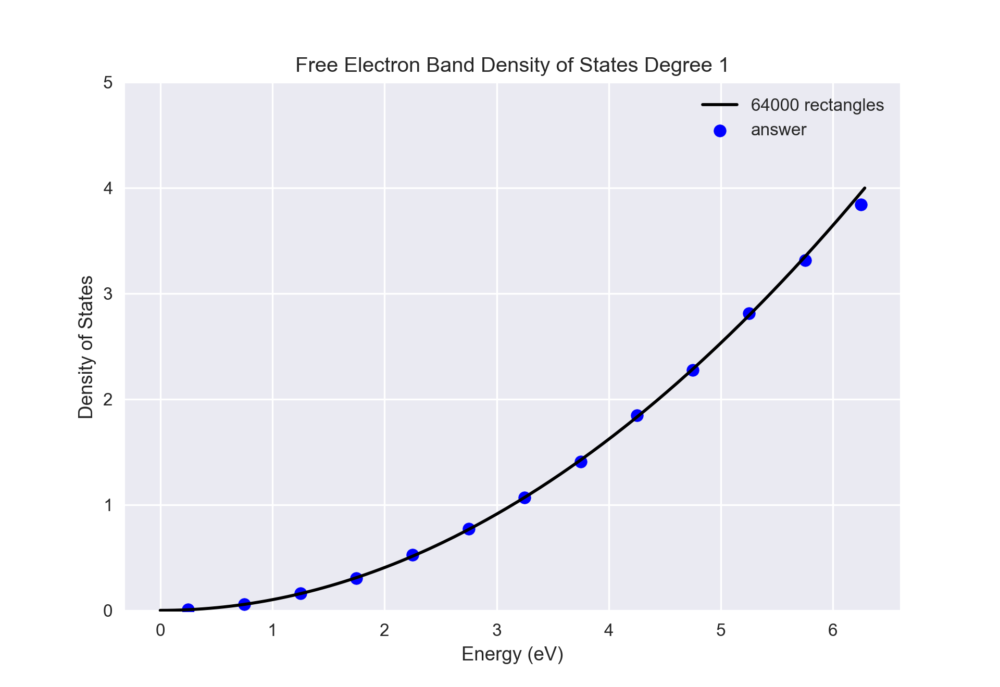

In [144]:
max_energy = 2*np.pi
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(1)
rec_dos_args = {"PP": multiple_free_PP,
                "grid": rec_grid,
                "tetrahedra": None,
                "weights": None,
                "method": "rectangles",
                "energy_list": energy_list,
                "quantity": "dos",
                "nbands": 19,
                "answer": free_dos,
                "title": "Free Electron Band Density of States Degree 1",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 5],
                "labels": ["%i rectangles"%len(rec_grid), "answer"],
                "bin_size": .5,
                "save": "rectangles_DOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Multiple Free Electron/degree_1/")}
plot_states(**rec_dos_args)

In [ ]:
max_energy = 2*np.pi
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(2)
tet_dos_args = {"PP": multiple_free_PP,
                "grid": tet_grid,
                "tetrahedra": tetrahedra,
                "weights": weights,
                "method": "tetrahedra",
                "energy_list": energy_list,
                "quantity": "dos",
                "nbands": 19,
                "answer": free_dos,
                "title": "Free Electron Band Density of States Degree 1",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 0.3],
                "labels": ["%i tetrahedra"%np.sum(weights), "answer"],
                "bin_size": .5,
                "save": "tetrahedra_DOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Multiple Free Electron/degree_1/")}
plot_states(**tet_dos_args)

<IPython.core.display.Javascript object>


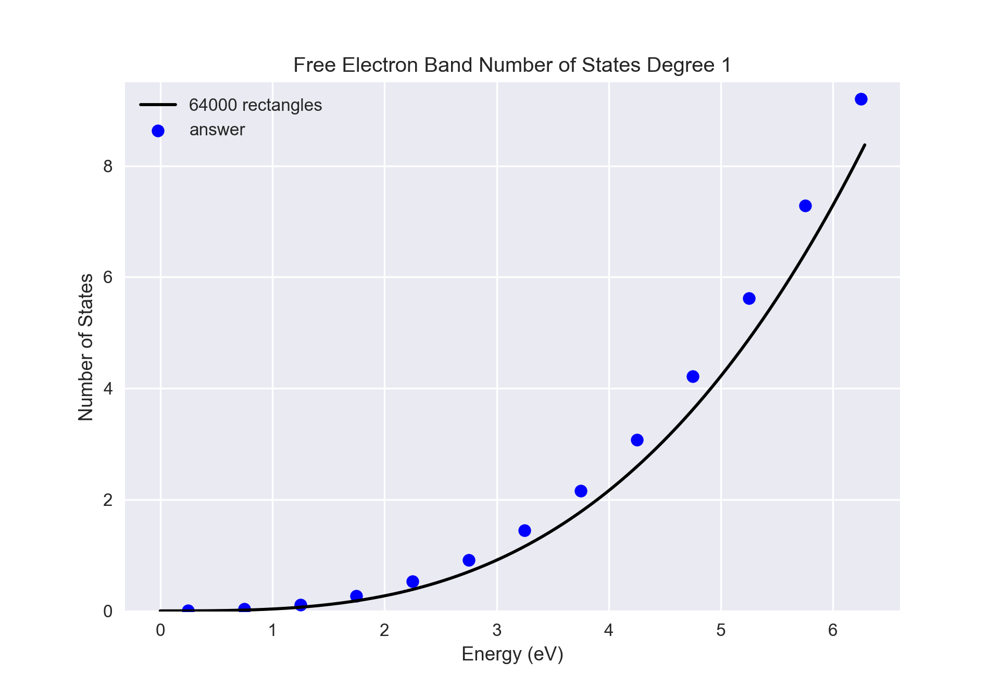

In [149]:
max_energy = 2*np.pi
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(1)
rec_nos_args = {"PP": multiple_free_PP,
                "grid": rec_grid,
                "tetrahedra": None,
                "weights": None,
                "method": "rectangles",
                "energy_list": energy_list,
                "quantity": "nos",
                "nbands": 19,
                "answer": free_nos,
                "title": "Free Electron Band Number of States Degree 1",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 9.5],
                "labels": ["%i rectangles"%len(rec_grid), "answer"],
                "bin_size": .5,
                "save": "rectangles_NOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Multiple Free Electron/degree_1/")}
plot_states(**rec_nos_args)

In [ ]:
max_energy = 2*np.pi
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

free_PP.set_degree(2)
tet_dos_args = {"PP": multiple_free_PP,
                "grid": tet_grid,
                "tetrahedra": tetrahedra,
                "weights": weights,
                "method": "tetrahedra",
                "energy_list": energy_list,
                "quantity": "dos",
                "nbands": 9,
                "answer": free_dos,
                "title": "Free Electron Band Density of States Degree 1",
                "xlimits": [min(energy_list) - dE, 
                            max(energy_list) + dE],
                "ylimits": [-0.01, 9.5],
                "labels": ["%i tetrahedra"%np.sum(weights), "answer"],
                "bin_size": .5,
                "save": "tetrahedra_DOS.pdf",
                "root_dir": "/Users/jeremyjorgensen/Codes/BZI/plots/" + (
                            "Multiple Free Electron/degree_1/")}
plot_states(**tet_dos_args)

#### Testing data generation

In [12]:
free_PP.set_degree(2)
max_energy = np.pi**free_PP.degree
dE = max_energy*0.05
npts = 200
energy_list = np.linspace(0, max_energy, npts)

rec_weights = np.ones(len(rec_grid), dtype=int)
tet_weights = np.ones(len(tetrahedra))
args = {"EPM": free_PP,
        "nbands": 1,
        "grid": rec_grid,
        "methods_list": ["rectangles", "tetrahedra"],
        "weights_list": [rec_weights, tet_weights],
        "energy_list": energy_list,
        "file_location": "/Users/jeremyjorgensen/Codes/BZI",
        "file_number": "1",
        "bin_size": 0.5,
        "tetrahedra": tetrahedra}

generate_states_data(**args)

('data', '/Users/jeremyjorgensen/Codes/BZI/data/free electron model/degree_2/valency_1/rectangles/run_1.p')


<IPython.core.display.Javascript object>


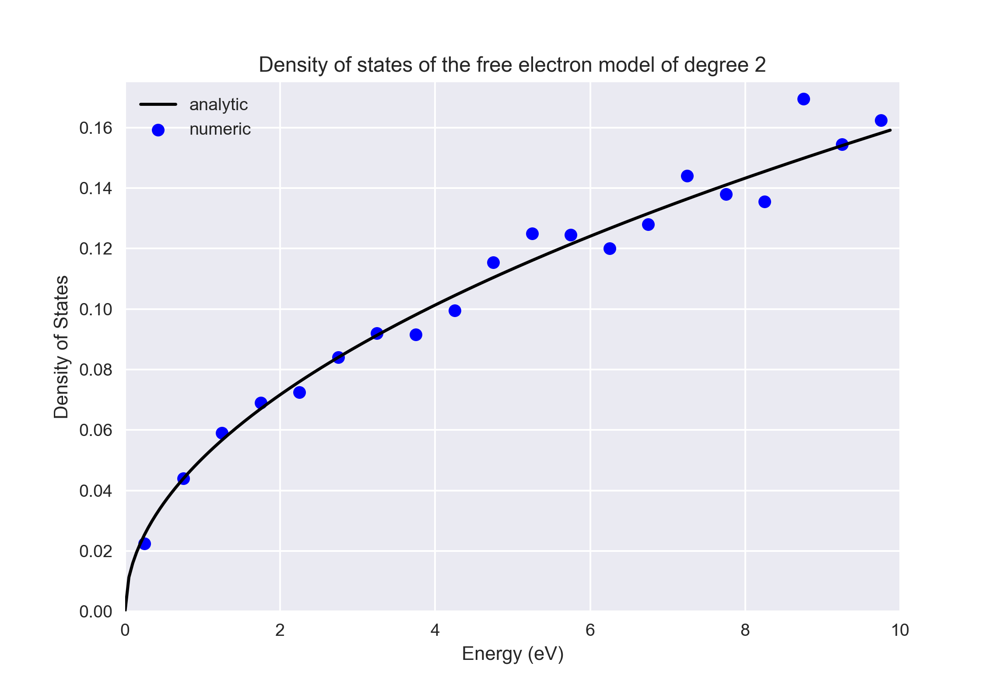

In [16]:
args = {"EPM": free_PP,
        "file_location": "/Users/jeremyjorgensen/Codes/BZI",
        "file_number": 1,
        "file_name": "dos_1",
        "quantity": "density of states",
        "method": "rectangles",
        "title": "Density of states of the free electron model of degree 2",
        "xlimits": [0, 10],
        "ylimits": [0, 0.175],
        "labels": ["numeric", "analytic"],
       }


plot_states_data(**args)